# Analyse von Unfällen mit Radbeteiligigung 
* in Abhängigkeit von geltenden Geschwindigkeitsbegrenzungen (OSM) und DTV aus SVZ2015 
* zusätzlich mit Stadtradelndaten als layer
* künftig auch mit "subjektiver Sicherheit" in form von Überholabständen
* am Bespiel BB LDS

In [4]:
import pandas as pd
import geopandas as gpd

## Unfalldaten (Destatis) einlesen
https://unfallatlas.statistikportal.de/_opendata2021.html

In [200]:
pd.read_csv('csv/Unfallorte2018_LinRef.txt', sep=';', dtype={'OBJECTID': 'float'}, low_memory=False)

,OBJECTID_1,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,UKATEGORIE,...,IstPKW,IstFuss,IstKrad,IstGkfz,IstSonstig,STRZUSTAND,LINREFX,LINREFY,XGCSWGS84,YGCSWGS84
0,1,1,0,3,0,2018,1,8,5,2,...,0,0,0,0,0,0,"612054,341999999950000","5969634,006000000100000","10,703950299000041","53,863081147000059"
1,2,1,0,62,20,2018,1,15,6,3,...,1,0,0,0,0,1,"592301,984999999990000","5938800,026999999800000","10,394496814000036","53,589905976000068"
2,3,1,0,56,15,2018,1,19,4,3,...,1,0,0,0,0,1,"547114,933199999970000","5955266,091099999800000","9,714396363000049","53,743906875000050"
3,4,1,0,59,37,2018,1,10,5,3,...,1,0,0,0,0,1,"534122,484399999960000","6054521,118599999700000","9,528665857000021","54,636949491000053"
4,5,1,0,58,150,2018,1,13,3,3,...,1,0,0,0,0,0,"572287,658999999990000","6037455,893000000200000","10,115679928000077","54,479588354000043"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211863,211864,15,0,84,590,2018,12,14,6,3,...,1,0,0,0,0,1,"717963,815100000010000","5663444,656299999900000","12,111988202000077","51,081042682000032"
211864,211865,15,0,82,180,2018,12,15,6,3,...,1,0,0,0,0,1,"703928,125000000000000","5737095,589999999900000","11,954244662000065","51,747592877000045"
211865,211866,15,0,88,205,2018,12,6,3,3,...,1,0,0,0,0,1,"710364,695799999990000","5690828,789699999600000","12,019706461000055","51,329781454000056"
211866,211867,15,0,87,130,2018,12,10,3,3,...,1,0,1,0,0,0,"676794,362399999980000","5703031,972699999800000","11,544450969000025","51,450830959000029"


In [5]:
#data=pd.read_csv(r"csv\Unfallorte2020_LinRef.csv", nrows=200, sep=';')

In [217]:
jahre=['2017','2018','2019','2020']

data=pd.DataFrame()
for jahr in jahre:
    if jahr=='2020':
        data_j=pd.read_csv('csv/Unfallorte'+jahr+'_LinRef.csv', sep=';', low_memory=False)
    else:
        data_j=pd.read_csv('csv/Unfallorte'+jahr+'_LinRef.txt', sep=';', low_memory=False)
    
    
    #if jahr =="2020":
    data_j=data_j.rename(columns={"UIDENTSTLAE": "UIDENTSTLA"})
    data_j=data_j.rename(columns={"ULICHTVERH": "LICHT"})
    data_j=data_j.rename(columns={"OBJECTID_1": "OBJECTID"})
        
    #if jahr =="2018":
            
    
    data=data.append(data_j, ignore_index=True)

In [218]:
#data_j

In [219]:
data

,OBJECTID,UIDENTSTLA,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,...,IstKrad,IstSonstig,LICHT,STRZUSTAND,LINREFX,LINREFY,XGCSWGS84,YGCSWGS84,IstGkfz,IstSonstige
0,1,01170113152013852017,1,0,55,12,2017,1,5,6,...,0,0.0,2,2,"605079,422900000010000","6001757,554700000200000","10,609031240000036","54,153150062000066",NaN,NaN
1,2,01170113171013912017,1,0,60,53,2017,1,6,6,...,0,1.0,2,1,"582297,218400000010000","5969288,968000000300000","10,251497589000053","53,865551422000067",NaN,NaN
2,3,01170106105132242017,1,0,61,11,2017,1,18,6,...,0,0.0,2,1,"522799,299999999990000","5990575,725999999800000","9,348343807000049","54,062896651000074",NaN,NaN
3,4,01170114152013542018,1,0,55,42,2017,1,12,7,...,0,0.0,0,0,"616128,937799999960000","5981557,289699999600000","10,770405204000042","53,969301629000029",NaN,NaN
4,5,01170106161013732017,1,0,62,60,2017,1,8,6,...,0,0.0,0,1,"581575,998700000000000","5934905,202899999900000","10,231475138000064","53,556683829000065",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
913456,237990,7201218001622561470,7,1,38,45,2020,12,17,6,...,1,NaN,2,1,"391675,607900000180000","5589115,281999999700000","7,474374137000041","50,444042102000026",0.0,0.0
913457,237991,7201205004532517100,7,3,32,49,2020,12,8,7,...,0,NaN,0,1,"438750,044599999670000","5484883,899299999700000","8,153857415000061","49,513483991000044",0.0,0.0
913458,237992,7201215001362551920,7,1,41,75,2020,12,17,3,...,0,NaN,2,1,"400274,490199999880000","5575067,228599999100000","7,599165158000062","50,319263897000042",0.0,0.0
913459,237993,7201120004334563460,7,3,14,0,2020,11,7,6,...,0,NaN,1,0,"454090,255400000140000","5482031,062799999500000","8,366091643000061","49,489180504000046",0.0,0.0


In [220]:
data.columns

Index(['OBJECTID', 'UIDENTSTLA', 'ULAND', 'UREGBEZ', 'UKREIS', 'UGEMEINDE',
       'UJAHR', 'UMONAT', 'USTUNDE', 'UWOCHENTAG', 'UKATEGORIE', 'UART',
       'UTYP1', 'IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstSonstig',
       'LICHT', 'STRZUSTAND', 'LINREFX', 'LINREFY', 'XGCSWGS84', 'YGCSWGS84',
       'IstGkfz', 'IstSonstige'],
      dtype='object')

In [221]:
#data=pd.read_csv(r"csv\Unfallorte2020_LinRef.csv", sep=';')

In [222]:
len(data)

913461

In [223]:
data.YGCSWGS84=data.YGCSWGS84.str.replace(',','.').astype(float)
data.XGCSWGS84=data.XGCSWGS84.str.replace(',','.').astype(float)

In [224]:
gdf = gpd.GeoDataFrame(
    data, geometry=gpd.points_from_xy(data.XGCSWGS84,data.YGCSWGS84), crs='EPSG:4326')

<AxesSubplot:>

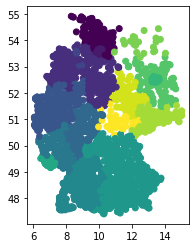

In [225]:
gdf[::200].plot(column='ULAND')

In [226]:
import matplotlib.pyplot as plt
from matplotlib import cm

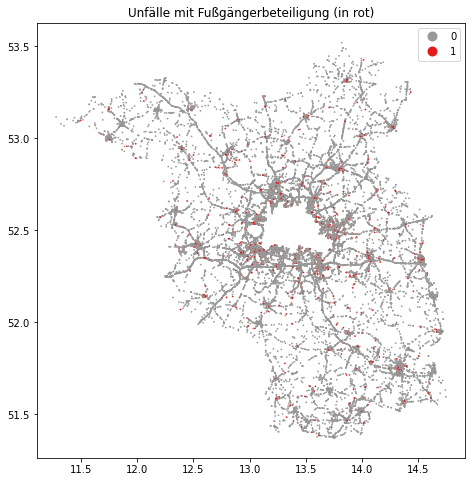

In [227]:
gdf[gdf.ULAND==12].plot(column='IstFuss', markersize=0.5, legend=True, categorical=True, cmap='Set1_r', figsize=(8,8))
plt.title("Unfälle mit Fußgängerbeteiligung (in rot)");

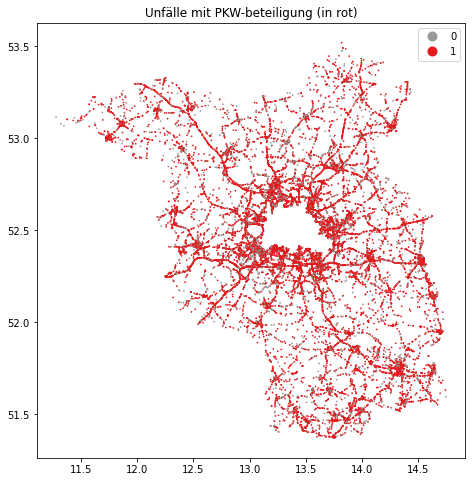

In [228]:
gdf[gdf.ULAND==12].plot(column='IstPKW', markersize=0.5, legend=True, categorical=True, cmap='Set1_r', figsize=(8,8))
plt.title("Unfälle mit PKW-beteiligung (in rot)");

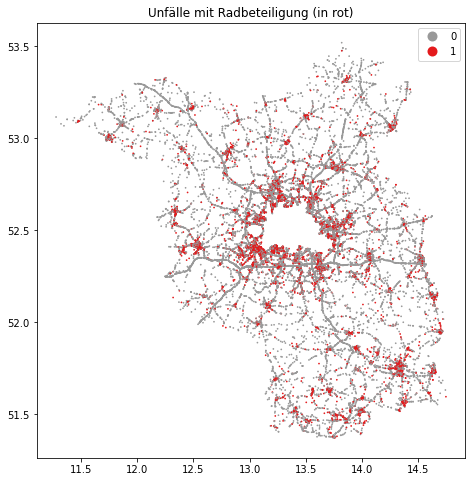

In [229]:
gdf[gdf.ULAND==12].plot(column='IstRad', markersize=0.5, legend=True, categorical=True, cmap='Set1_r', figsize=(8,8))
plt.title("Unfälle mit Radbeteiligung (in rot)");

In [230]:
#gdf[gdf.ULAND==11].plot(markersize=0.5, figsize=(10,10))

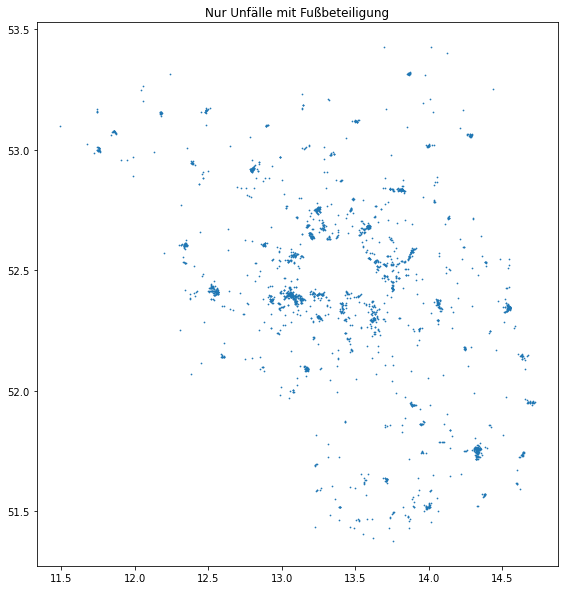

In [231]:
gdf[(gdf.ULAND==12) & (gdf.IstFuss==1)].plot(markersize=0.5, figsize=(10,10))
plt.title("Nur Unfälle mit Fußbeteiligung");

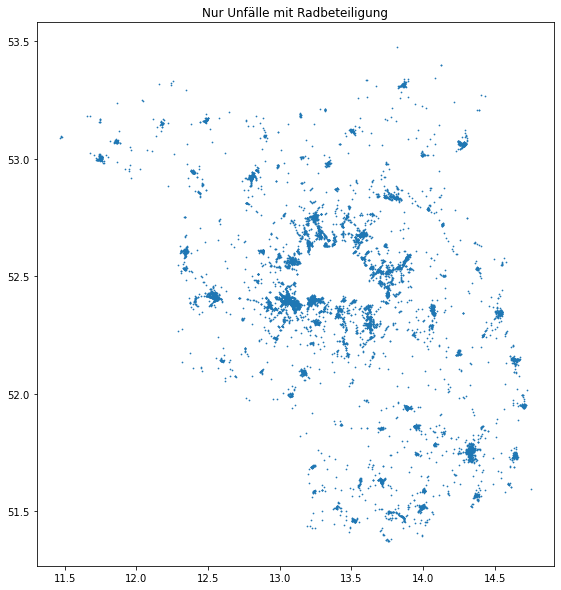

In [232]:
gdf[(gdf.ULAND==12) & (gdf.IstRad==1)].plot(markersize=0.5, figsize=(10,10))
plt.title("Nur Unfälle mit Radbeteiligung");

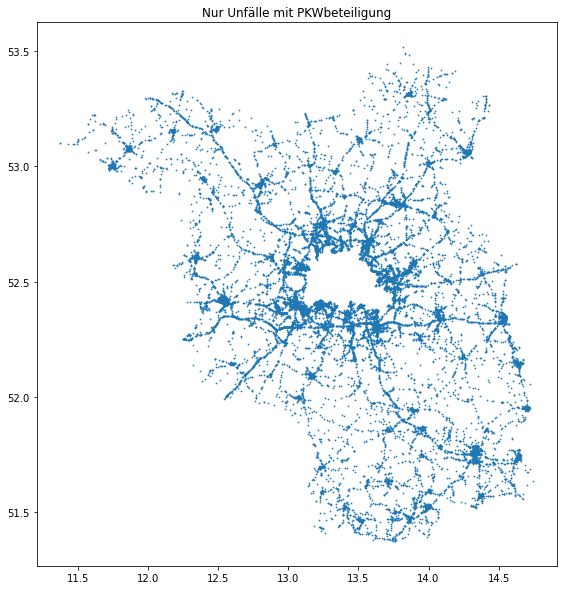

In [233]:
gdf[(gdf.ULAND==12) & (gdf.IstPKW==1)].plot(markersize=0.5, figsize=(10,10))
plt.title("Nur Unfälle mit PKWbeteiligung");

# DTV also Verkehrsstärkedaten (aus SVZ2015, Quelle: LS Brandenburg)

In [234]:
dtv=gpd.read_file(r"..\luftdaten_dtv\data\brandenburg_svz_lines.shp")

In [235]:
dtv.head()

,anfangsnet,endnetzkno,vonStation,bisStation,strasse,klasse,gesamtabsc,abschnitts,zaehlstell,jahr,KFZ,DTV_SV,SV_KFZ,DTV,geometry
0,3144003,3144005,0.0,7564.0,L 19,L,7564.0,020,31443150,2015.0,2400.0,104.0,4.3,2400,"LINESTRING (367501.362 5852122.937, 367408.069..."
1,3145004,3145002,0.0,8064.0,B 96,B,8064.0,810,31453619,2015.0,18339.0,1504.0,8.2,18339,"LINESTRING (380228.510 5852960.437, 380223.711..."
2,3146004,3145004,0.0,12284.0,L 213,L,12284.0,010,31453001,2015.0,2952.0,229.0,7.8,2952,"LINESTRING (388773.101 5860175.998, 388717.169..."
3,3243003,3244002,0.0,4108.0,L 162,L,4108.0,010,32433110,2015.0,1676.0,183.0,10.9,1676,"LINESTRING (361464.464 5846157.042, 361504.572..."
4,3243009,3244010,0.0,2360.0,A 24,A,2898.0,120,32433612,2015.0,52248.0,6449.0,12.3,52248,"LINESTRING (363409.255 5842752.435, 363444.918..."


<AxesSubplot:>

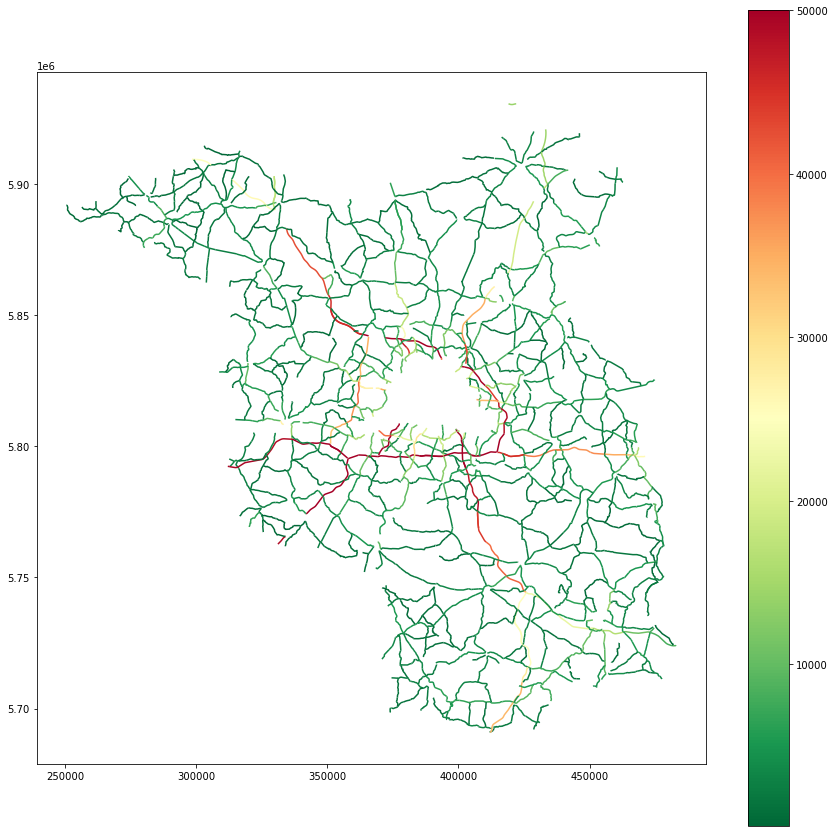

In [236]:
dtv.plot(column='DTV', figsize=(15,15), cmap='RdYlGn_r', legend=True, vmax=50000)
#plt.title("Brandenburg SVZ2015")

In [237]:
bland = gpd.read_file("https://raw.githubusercontent.com/isellsoap/deutschlandGeoJSON/main/2_bundeslaender/4_niedrig.geo.json")

In [238]:
bland[bland.name=="Brandenburg"]

,id,name,type,geometry
3,DE-BB,Brandenburg,State,"POLYGON ((13.87951 53.50107, 13.91737 53.42054..."


In [239]:
osm_links = gpd.read_file('..\osm_processing\some_highways_brandenburg_maxspeed.gpkg', 
                          layer='lines',
                         mask=bland[bland.name=="Brandenburg"])


In [240]:
osm_links

,osm_id,name,highway,ref,maxspeed,lanes,other_tags,geometry
0,23652040,Fährstraße,residential,None,100,None,"""source:maxspeed""=>""sign"",""surface""=>""asphalt""","LINESTRING (11.35236 53.05662, 11.35243 53.057..."
1,348349597,Am Elbdeich,residential,None,30,None,"""source:maxspeed""=>""sign"",""surface""=>""asphalt""","LINESTRING (11.34515 53.05778, 11.34583 53.057..."
2,23652038,Pappelweg,residential,None,30,None,"""maxweight""=>""9"",""surface""=>""asphalt""","LINESTRING (11.36066 53.06660, 11.36050 53.065..."
3,23652041,Pappelweg,residential,None,30,None,"""maxweight""=>""9""","LINESTRING (11.35323 53.06464, 11.35339 53.064..."
4,350653115,None,residential,None,None,None,"""lit""=>""no"",""maxspeed:type""=>""DE:urban"",""nonam...","LINESTRING (11.35230 53.06651, 11.35195 53.065..."
...,...,...,...,...,...,...,...,...
99828,38628509,Jahnstraße,secondary,L 200,50,None,"""cycleway:both""=>""separate"",""foot""=>""use_sidep...","LINESTRING (13.58587 52.68198, 13.58524 52.681..."
99829,77348145,Mühlenstraße,residential,None,30,None,"""lit""=>""yes"",""oneway""=>""yes"",""sidewalk""=>""both...","LINESTRING (13.58604 52.67994, 13.58564 52.68010)"
99830,122234415,Mühlenstraße,residential,None,30,None,"""lit""=>""yes"",""maxheight""=>""3.45"",""oneway""=>""ye...","LINESTRING (13.58558 52.68012, 13.58548 52.68015)"
99831,248271908,Mühlenstraße,residential,None,30,None,"""lit""=>""yes"",""oneway""=>""yes"",""postal_code""=>""1...","LINESTRING (13.58564 52.68010, 13.58558 52.68012)"


<AxesSubplot:>

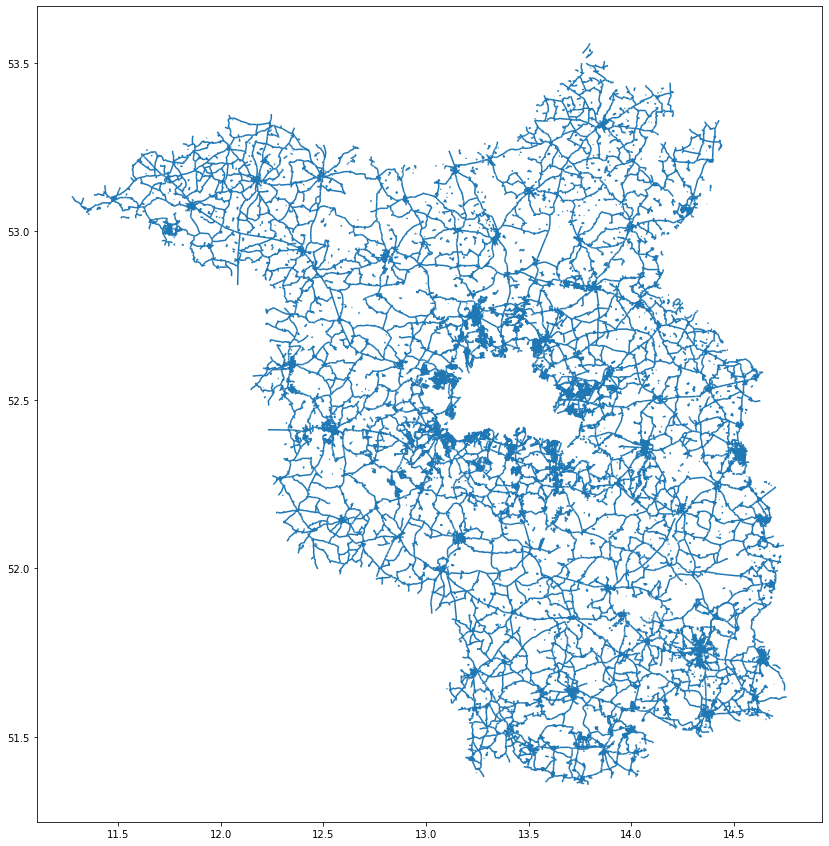

In [241]:
osm_links.plot(figsize=(15,15))

In [242]:
osm_links.maxspeed=osm_links.maxspeed.apply(lambda x: "50" if x=='DE:urban' else x )
osm_links.maxspeed=osm_links.maxspeed.apply(lambda x: "100" if x=='DE:rural' else x )
osm_links.maxspeed=osm_links.maxspeed.apply(lambda x: "7" if x=='walk' else x )

In [243]:
osm_links.maxspeed = osm_links.maxspeed.astype(float)

<AxesSubplot:>

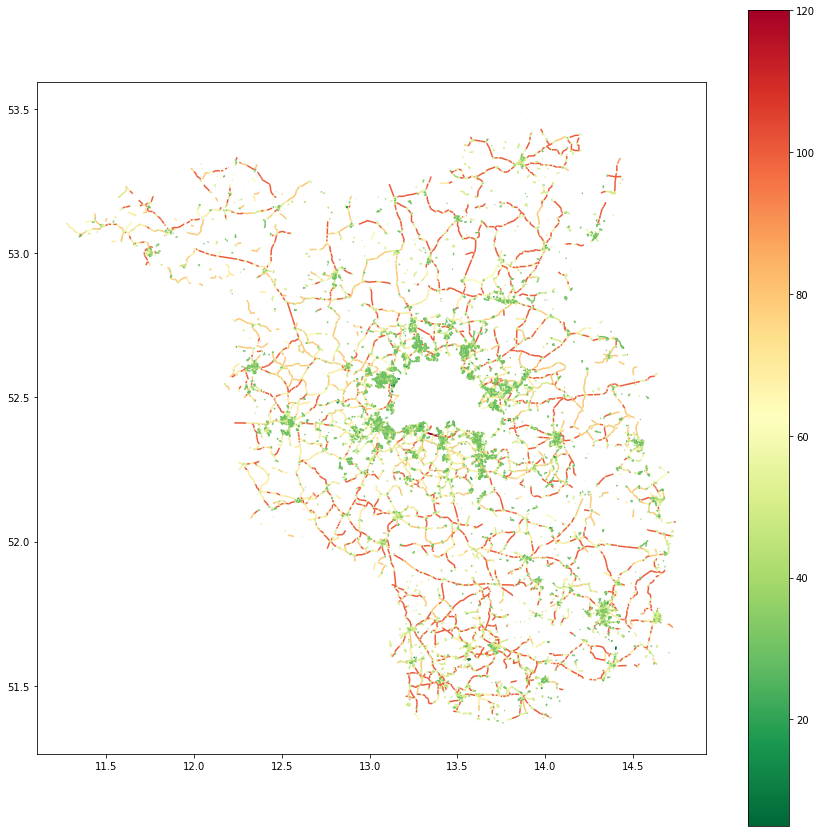

In [244]:
osm_links.plot(column='maxspeed', figsize=(15,15), cmap='RdYlGn_r', legend=True)

In [245]:
osm_links=osm_links.to_crs("EPSG:25833")

In [246]:
osm_links_cent=osm_links.copy()
osm_links_cent.geometry=osm_links.geometry.centroid

<AxesSubplot:>

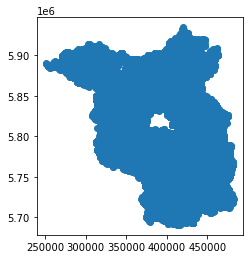

In [247]:
osm_links_cent.plot()

In [248]:
osm_links_cent[['osm_id','geometry']]

,osm_id,geometry
0,23652040,POINT (255595.359 5884995.337)
1,348349597,POINT (255338.132 5884982.722)
2,23652038,POINT (255995.048 5885509.391)
3,23652041,POINT (255852.164 5885622.819)
4,350653115,POINT (255616.492 5885768.564)
...,...,...
99828,38628509,POINT (404372.553 5837821.373)
99829,77348145,POINT (404397.530 5837614.720)
99830,122234415,POINT (404376.912 5837627.871)
99831,248271908,POINT (404382.070 5837624.671)


In [249]:

dtv_buffer=dtv[dtv.klasse!='A'].copy()
dtv_buffer.geometry=dtv.buffer(20).copy()

In [250]:
#sjoin=gpd.sjoin(dtv_buffer,osm_links_cent)

In [251]:
sjoin=gpd.sjoin(osm_links_cent[['osm_id','geometry']],dtv_buffer[['DTV','geometry']])

In [252]:
sjoin

,osm_id,geometry,index_right,DTV
7,370004891,POINT (255842.007 5885795.516),435,640
16,643148145,POINT (255899.438 5885809.272),435,640
28,5212496,POINT (256602.820 5886023.736),435,640
39,5212495,POINT (257924.482 5886741.818),435,640
41,370004890,POINT (256052.555 5885861.564),435,640
...,...,...,...,...
99454,700430965,POINT (405141.361 5837831.915),128,7750
99820,4682607,POINT (405023.186 5837832.483),128,7750
99493,809056081,POINT (407203.890 5842247.354),55,7750
99522,5398346,POINT (407263.984 5842343.831),55,7750


In [253]:
osm_links_dtv=osm_links.merge(sjoin[['osm_id','DTV']], on="osm_id")

In [254]:
osm_links_dtv

,osm_id,name,highway,ref,maxspeed,lanes,other_tags,geometry,DTV
0,370004891,Friedensstraße,primary,B 195,30.0,2,"""source:maxspeed""=>""sign"",""surface""=>""asphalt""","LINESTRING (255887.216 5885795.692, 255877.961...",640
1,370004892,Friedensstraße,primary,B 195,50.0,None,"""surface""=>""asphalt""","LINESTRING (255797.757 5885809.086, 255776.496...",640
2,5212497,Ringstraße,primary,B 195,60.0,None,"""source:maxspeed""=>""sign""","LINESTRING (255002.272 5886346.448, 254965.606...",640
3,370004915,Ringstraße,primary,B 195,80.0,None,"""source:maxspeed""=>""sign""","LINESTRING (254433.478 5886626.556, 254357.284...",640
4,643148145,Friedensstraße,primary,B 195,NaN,2,"""maxspeed:backward""=>""50"",""maxspeed:forward""=>...","LINESTRING (255909.714 5885824.666, 255895.014...",640
...,...,...,...,...,...,...,...,...,...
20386,1073746560,Kastanienweg,residential,None,NaN,None,None,"LINESTRING (404584.934 5838632.861, 404577.837...",2002
20387,4682629,August-Bebel-Straße,secondary,L 30,50.0,2,"""postal_code""=>""16321"",""sidewalk""=>""both"",""sur...","LINESTRING (404711.421 5837789.854, 404718.023...",2063
20388,4682607,Jahnstraße,secondary,L 200,50.0,2,"""lit""=>""yes"",""old_ref""=>""B 2"",""postal_code""=>""...","LINESTRING (405128.592 5837830.221, 405117.143...",7750
20389,4682633,Börnicker Straße,secondary,L 30,50.0,2,"""postal_code""=>""16321"",""sidewalk""=>""both"",""smo...","LINESTRING (404934.183 5837516.706, 404936.316...",2063


<AxesSubplot:>

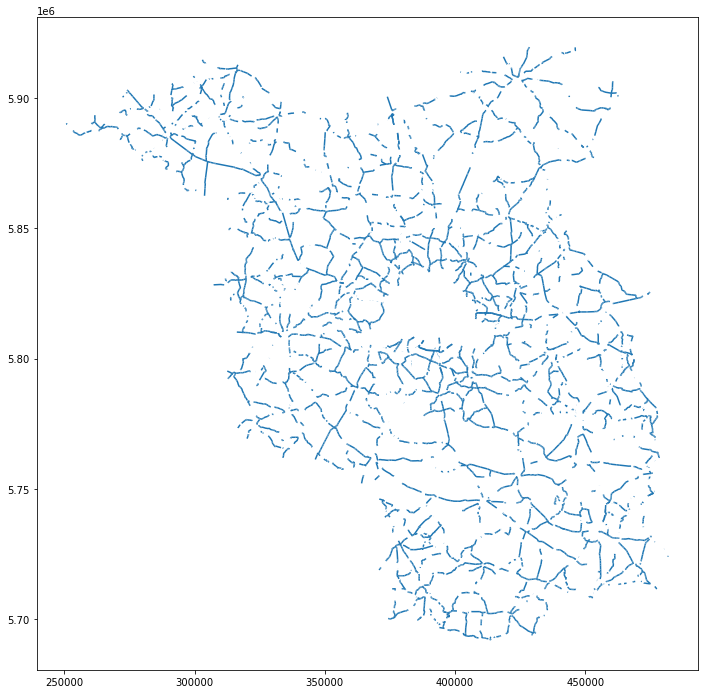

In [255]:
osm_links_dtv.plot(figsize=(12,12))

<AxesSubplot:>

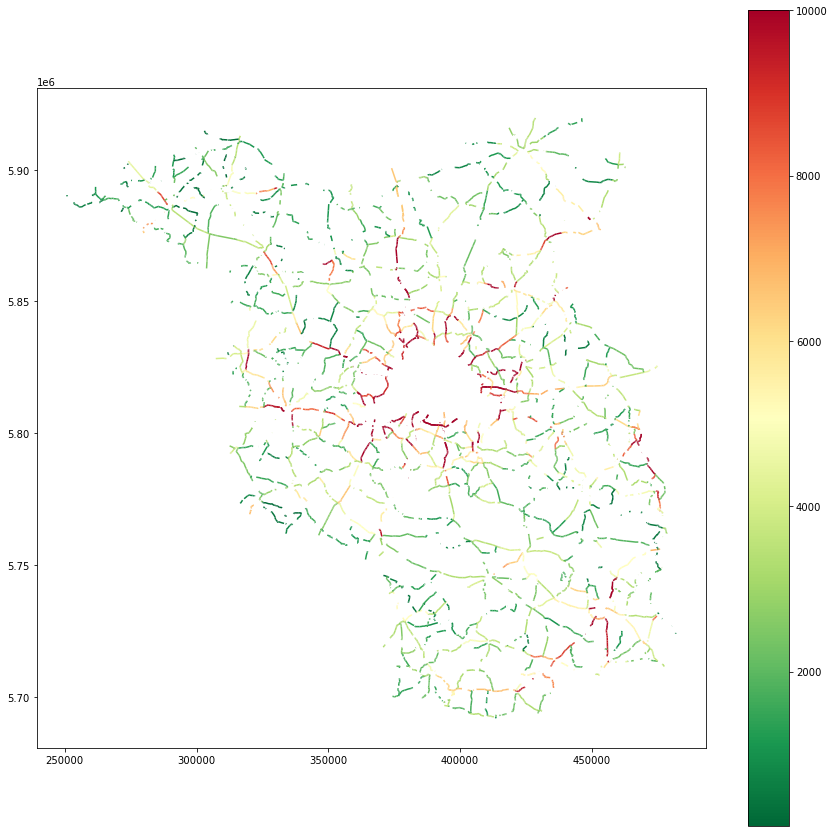

In [256]:
osm_links_dtv.plot(column='DTV', figsize=(15,15), cmap='RdYlGn_r', legend=True, vmax=10000)

In [257]:
#osm_links_dtv.maxspeed=osm_links_dtv.maxspeed.apply(lambda x: "50" if x=='DE:urban' else x )
#osm_links_dtv.maxspeed=osm_links_dtv.maxspeed.apply(lambda x: "100" if x=='DE:rural' else x )

In [258]:
#osm_links_dtv.maxspeed = osm_links_dtv.maxspeed.astype(float)

<AxesSubplot:>

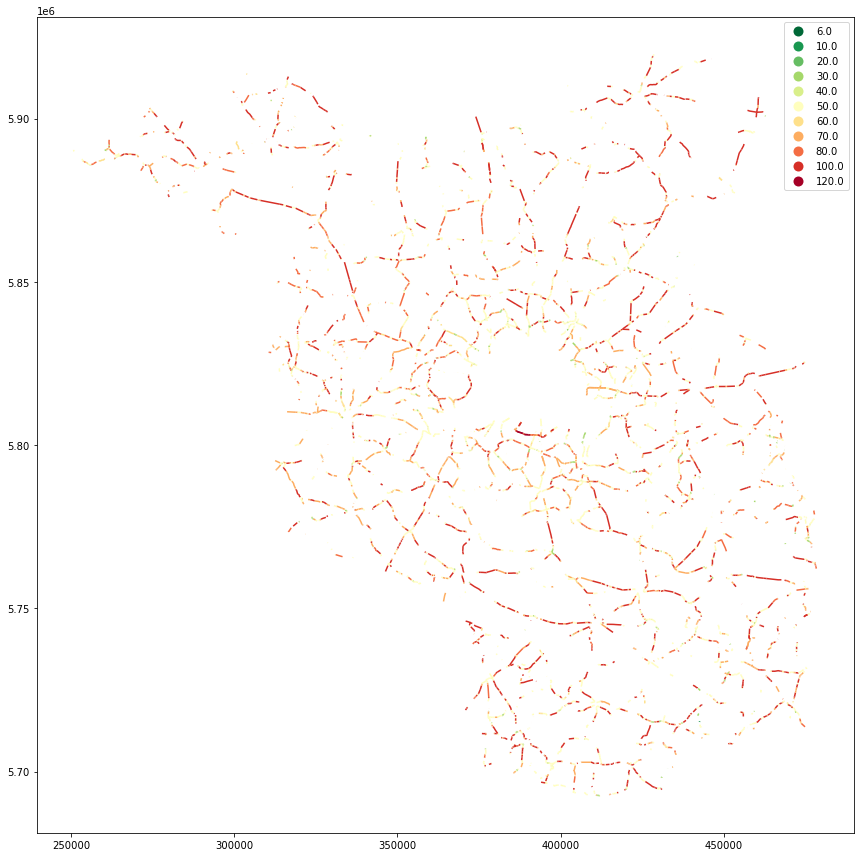

In [259]:
osm_links_dtv.plot(column='maxspeed', figsize=(15,15), cmap='RdYlGn_r', legend=True, categorical=True)#, vmax=50000)

In [310]:
# LDS
#kreise = gpd.read_file("https://raw.githubusercontent.com/isellsoap/deutschlandGeoJSON/main/4_kreise/4_niedrig.geo.json")
kreise = gpd.read_file("https://raw.githubusercontent.com/isellsoap/deutschlandGeoJSON/main/4_kreise/2_hoch.geo.json")


In [311]:
kreise[kreise.NAME_1=="Brandenburg"]

,ID_0,ISO,NAME_0,ID_1,NAME_1,ID_2,NAME_2,ID_3,NAME_3,NL_NAME_3,VARNAME_3,TYPE_3,ENGTYPE_3,geometry
158,86,DEU,Germany,4,Brandenburg,13,Brandenburg,142,Barnim,None,None,Landkreise,Rural district,"POLYGON ((13.52148 52.98590, 13.53369 52.98572..."
159,86,DEU,Germany,4,Brandenburg,13,Brandenburg,143,Brandenburg an der Havel Städte,None,None,Kreisfreie Städte,Urban district,"POLYGON ((12.43651 52.45177, 12.43640 52.44807..."
160,86,DEU,Germany,4,Brandenburg,13,Brandenburg,144,Cottbus Städte,None,None,Kreisfreie Städte,Urban district,"POLYGON ((14.34391 51.84828, 14.34987 51.84795..."
161,86,DEU,Germany,4,Brandenburg,13,Brandenburg,145,Dahme-Spreewald,None,None,Landkreise,Rural district,"POLYGON ((13.70535 52.38250, 13.71157 52.38610..."
162,86,DEU,Germany,4,Brandenburg,13,Brandenburg,146,Elbe-Elster,None,None,Landkreise,Rural district,"POLYGON ((13.52135 51.79288, 13.52118 51.78918..."
163,86,DEU,Germany,4,Brandenburg,13,Brandenburg,147,Frankfurt am Oder Städte,None,None,Kreisfreie Städte,Urban district,"POLYGON ((14.52891 52.39641, 14.53467 52.39251..."
164,86,DEU,Germany,4,Brandenburg,13,Brandenburg,148,Havelland,None,None,Landkreise,Rural district,"POLYGON ((12.83558 52.69160, 12.87254 52.69854..."
165,86,DEU,Germany,4,Brandenburg,13,Brandenburg,149,Märkisch-Oderland,None,None,Landkreise,Rural district,"POLYGON ((14.14254 52.86895, 14.13604 52.86550..."
166,86,DEU,Germany,4,Brandenburg,13,Brandenburg,150,Oberhavel,None,None,Landkreise,Rural district,"POLYGON ((13.24419 53.23158, 13.25035 53.23148..."
167,86,DEU,Germany,4,Brandenburg,13,Brandenburg,151,Oberspreewald-Lausitz,None,None,Landkreise,Rural district,"POLYGON ((14.10119 51.88172, 14.09506 51.87819..."


<AxesSubplot:>

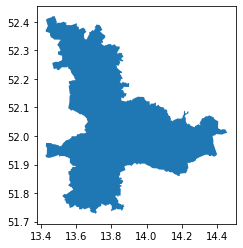

In [312]:
#kreise_sel=kreise[kreise.NAME_3.isin(["Dahme-Spreewald","Oder-Spree","Teltow-Fläming"])]
kreise_sel=kreise[kreise.NAME_3.isin(["Dahme-Spreewald"])]

kreise_sel.plot()

In [313]:
kreise_sel=kreise_sel.to_crs("EPSG:25833")

In [314]:
osm_links_dtv

,osm_id,name,highway,ref,maxspeed,lanes,other_tags,geometry,DTV
0,370004891,Friedensstraße,primary,B 195,30.0,2,"""source:maxspeed""=>""sign"",""surface""=>""asphalt""","LINESTRING (255887.216 5885795.692, 255877.961...",640
1,370004892,Friedensstraße,primary,B 195,50.0,None,"""surface""=>""asphalt""","LINESTRING (255797.757 5885809.086, 255776.496...",640
2,5212497,Ringstraße,primary,B 195,60.0,None,"""source:maxspeed""=>""sign""","LINESTRING (255002.272 5886346.448, 254965.606...",640
3,370004915,Ringstraße,primary,B 195,80.0,None,"""source:maxspeed""=>""sign""","LINESTRING (254433.478 5886626.556, 254357.284...",640
4,643148145,Friedensstraße,primary,B 195,NaN,2,"""maxspeed:backward""=>""50"",""maxspeed:forward""=>...","LINESTRING (255909.714 5885824.666, 255895.014...",640
...,...,...,...,...,...,...,...,...,...
20386,1073746560,Kastanienweg,residential,None,NaN,None,None,"LINESTRING (404584.934 5838632.861, 404577.837...",2002
20387,4682629,August-Bebel-Straße,secondary,L 30,50.0,2,"""postal_code""=>""16321"",""sidewalk""=>""both"",""sur...","LINESTRING (404711.421 5837789.854, 404718.023...",2063
20388,4682607,Jahnstraße,secondary,L 200,50.0,2,"""lit""=>""yes"",""old_ref""=>""B 2"",""postal_code""=>""...","LINESTRING (405128.592 5837830.221, 405117.143...",7750
20389,4682633,Börnicker Straße,secondary,L 30,50.0,2,"""postal_code""=>""16321"",""sidewalk""=>""both"",""smo...","LINESTRING (404934.183 5837516.706, 404936.316...",2063


In [315]:
osm_links_dtv_kreise = gpd.clip(osm_links_dtv, kreise_sel)

<AxesSubplot:>

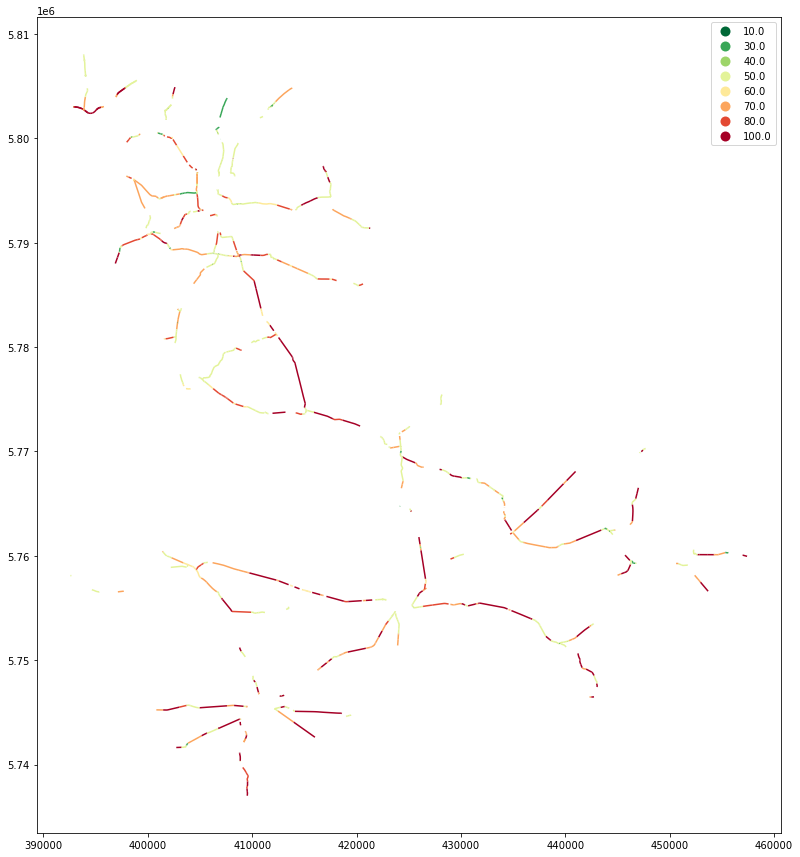

In [316]:
osm_links_dtv_kreise.plot(column='maxspeed', figsize=(15,15), cmap='RdYlGn_r', legend=True, categorical=True)#, vmax=50000)

In [317]:
osm_links_dtv_kreise

,osm_id,name,highway,ref,maxspeed,lanes,other_tags,geometry,DTV
16976,171930853,None,primary,B 87,100.0,2,"""surface""=>""asphalt""","LINESTRING (403234.371 5741654.809, 403168.353...",4050
16978,33998610,Wüstermarke,primary,B 87,50.0,2,"""surface""=>""asphalt""","LINESTRING (403696.250 5741853.452, 403681.204...",4050
9766,317587876,Wüstermarke,primary,B 87,30.0,2,"""surface""=>""asphalt""","LINESTRING (403736.792 5741908.890, 403696.250...",4050
9765,317587875,Wüstermarke,primary,B 87,10.0,2,"""surface""=>""asphalt""","LINESTRING (403754.066 5741930.977, 403746.236...",4050
9757,34200745,Wüstermarke,primary,B 87,30.0,2,"""surface""=>""asphalt""","LINESTRING (403836.622 5742030.735, 403824.261...",4050
...,...,...,...,...,...,...,...,...,...
13036,319279914,None,primary,B 87,70.0,2,"""destination:forward""=>""Beeskow, Mittweide"",""l...","LINESTRING (439973.528 5767050.028, 440134.791...",3597
13037,125301231,None,primary,B 87,100.0,2,"""lit""=>""no"",""surface""=>""asphalt""","LINESTRING (440134.791 5767216.244, 440225.156...",3597
15424,334181791,Neu Zittauer Straße,secondary,L 30,50.0,2,"""lit""=>""yes"",""sidewalk""=>""right"",""smoothness""=...","LINESTRING (412098.424 5803354.745, 412122.787...",6579
15427,926774474,Neu Zittauer Straße,secondary,L 30,50.0,2,"""bicycle:forward""=>""use_sidepath"",""cycleway:le...","LINESTRING (412149.500 5803416.461, 412170.519...",6579


In [318]:
#osm_links_dtv_kreise_crs=osm_links_dtv_kreise.to_crs("EPSG:4326")
#osm_links_dtv_kreise_crs.dissolve().centroid

In [387]:
import folium
import branca

field='maxspeed'
df=osm_links_dtv_kreise.copy()

osm_links_dtv_kreise_crs=osm_links_dtv_kreise.to_crs("EPSG:4326")
centroid=osm_links_dtv_kreise_crs.dissolve().centroid

m = folium.Map(location=[centroid.y, centroid.x], zoom_start=11, tiles='cartodbpositron')


colorscale = branca.colormap.LinearColormap(['green','yellow','red','red'], index=None, vmin=(df[field]).min(), vmax=(df[field]).max(), caption=field)








def style_function(feature):
    col=feature['properties'][field]
    wit=feature['properties']['DTV']
    
    return {
        'opacity': 0.8,
        #'weight': (wit/2000)+3,
        'weight': 10 if wit > 20000  else (wit/2000)+2,
        'color': 'grey' if col is None else colorscale(col)
    }

def highlight_function(feature):
    wit=feature['properties']['DTV']
    return {
         'weight': 10 if wit > 20000  else (wit/2000)+2+3,
        'color': 'black'
    }



m= folium.GeoJson(
    df,
   # name='elternzeit',
    tooltip=folium.GeoJsonTooltip(fields=['name', 'maxspeed', 'DTV']),
   style_function=style_function,
    highlight_function=highlight_function
).add_to(m)

#colorscale.caption = field
m.add_child(colorscale)

#m

C:\Users\simon\AppData\Local\Temp/ipykernel_19820/3349884653.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid=osm_links_dtv_kreise_crs.dissolve().centroid


In [320]:
## adding Unfalldaten

In [321]:
gdf_crs=gdf.to_crs("EPSG:25833")


In [322]:
unfall_kreise = gpd.clip(gdf_crs[gdf_crs.ULAND==12], kreise_sel)

In [323]:
unfall_kreise

,OBJECTID,UIDENTSTLA,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,...,IstSonstig,LICHT,STRZUSTAND,LINREFX,LINREFY,XGCSWGS84,YGCSWGS84,IstGkfz,IstSonstige,geometry
112767,112768,12170702642412717210,12,0,61,320,2017,7,12,1,...,0.0,0,0,"832631,838100000050000","5744361,843899999700000",13.819947,51.751165,NaN,NaN,POINT (418541.677 5734021.491)
256127,60899,NaN,12,0,66,52,2018,3,15,7,...,0.0,0,2,"835188,031899999940000","5744743,848700000000000",13.857212,51.753065,0.0,NaN,POINT (421117.299 5734191.840)
675563,97,12200123652322859620,12,0,66,52,2020,1,22,5,...,NaN,2,0,"835239,634499999690000","5744886,568800000500000",13.858095,51.754313,0.0,0.0,POINT (421180.378 5734329.655)
260791,65563,NaN,12,0,66,52,2018,11,14,1,...,0.0,0,1,"835240,291600000000000","5744887,480899999800000",13.858105,51.754321,0.0,NaN,POINT (421181.107 5734330.509)
256094,60866,NaN,12,0,66,52,2018,3,21,2,...,0.0,2,0,"835605,704499999990000","5745473,723600000100000",13.863946,51.759354,1.0,NaN,POINT (421592.943 5734884.001)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113065,113066,12170721662102782610,12,0,61,433,2017,7,11,6,...,0.0,0,0,"807438,719700000020000","5814902,352800000500000",13.519675,52.397823,NaN,NaN,POINT (399281.035 5806317.627)
257288,62060,NaN,12,0,61,433,2018,5,14,4,...,0.0,0,0,"810451,217300000020000","5812736,105000000400000",13.561804,52.376710,0.0,NaN,POINT (402100.594 5803911.601)
358142,162914,NaN,12,0,61,433,2018,4,16,3,...,1.0,0,1,"808277,524300000050000","5814724,753600000400000",13.531801,52.395760,0.0,NaN,POINT (400101.371 5806071.342)
808563,133097,12200131662102877970,12,0,61,433,2020,1,14,6,...,NaN,0,0,"808162,926799999550000","5814906,050899999200000",13.530289,52.397449,0.0,0.0,POINT (400002.305 5806261.319)


In [324]:
import matplotlib.pyplot as plt

<AxesSubplot:>

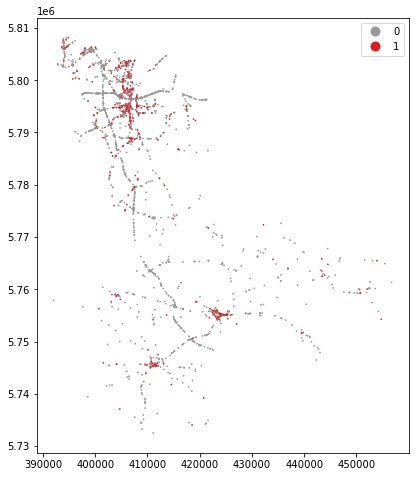

In [325]:
unfall_kreise.plot(column='IstRad', markersize=0.5, legend=True, categorical=True, cmap='Set1_r', figsize=(8,8))
#plt.title("Unfälle mit Radbeteiligung (in rot)");

In [326]:
unfall_kreise[unfall_kreise.IstRad==1]

,OBJECTID,UIDENTSTLA,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,...,IstSonstig,LICHT,STRZUSTAND,LINREFX,LINREFY,XGCSWGS84,YGCSWGS84,IstGkfz,IstSonstige,geometry
112767,112768,12170702642412717210,12,0,61,320,2017,7,12,1,...,0.0,0,0,"832631,838100000050000","5744361,843899999700000",13.819947,51.751165,NaN,NaN,POINT (418541.677 5734021.491)
675760,294,12200120652322858440,12,0,66,52,2020,1,14,2,...,NaN,0,0,"834431,332000000400000","5749725,005400000100000",13.851084,51.798144,0.0,0.0,POINT (420773.242 5739211.826)
256405,61177,NaN,12,0,61,320,2018,5,8,4,...,0.0,0,0,"828043,373099999970000","5751749,065899999800000",13.760686,51.820060,0.0,NaN,POINT (414581.293 5741751.367)
593908,186812,NaN,12,0,61,320,2019,4,9,3,...,NaN,0,0,"824363,327651939350000","5755003,577807031600000",13.710524,51.851370,0.0,0.0,POINT (411185.699 5745293.406)
359120,163892,NaN,12,0,61,320,2018,6,15,2,...,0.0,0,0,"825090,109500000020000","5755079,553100000100000",13.721112,51.851629,0.0,NaN,POINT (411915.393 5745309.278)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
594977,187881,NaN,12,0,61,433,2019,8,13,4,...,NaN,0,0,"807131,186138862740000","5814597,500769255700000",13.514890,52.395263,0.0,0.0,POINT (398949.625 5806039.613)
359726,164498,NaN,12,0,61,433,2018,9,20,5,...,0.0,2,1,"806213,424000000000000","5814631,445799999900000",13.501475,52.396081,0.0,NaN,POINT (398038.775 5806149.428)
260354,65126,NaN,12,0,61,433,2018,12,9,5,...,0.0,0,0,"807334,843499999960000","5814769,427600000100000",13.518031,52.396690,0.0,NaN,POINT (399166.613 5806193.902)
113065,113066,12170721662102782610,12,0,61,433,2017,7,11,6,...,0.0,0,0,"807438,719700000020000","5814902,352800000500000",13.519675,52.397823,NaN,NaN,POINT (399281.035 5806317.627)


In [327]:
unfall_kreise[unfall_kreise.IstRad==0]

,OBJECTID,UIDENTSTLA,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,...,IstSonstig,LICHT,STRZUSTAND,LINREFX,LINREFY,XGCSWGS84,YGCSWGS84,IstGkfz,IstSonstige,geometry
256127,60899,NaN,12,0,66,52,2018,3,15,7,...,0.0,0,2,"835188,031899999940000","5744743,848700000000000",13.857212,51.753065,0.0,NaN,POINT (421117.299 5734191.840)
675563,97,12200123652322859620,12,0,66,52,2020,1,22,5,...,NaN,2,0,"835239,634499999690000","5744886,568800000500000",13.858095,51.754313,0.0,0.0,POINT (421180.378 5734329.655)
260791,65563,NaN,12,0,66,52,2018,11,14,1,...,0.0,0,1,"835240,291600000000000","5744887,480899999800000",13.858105,51.754321,0.0,NaN,POINT (421181.107 5734330.509)
256094,60866,NaN,12,0,66,52,2018,3,21,2,...,0.0,2,0,"835605,704499999990000","5745473,723600000100000",13.863946,51.759354,1.0,NaN,POINT (421592.943 5734884.001)
677262,1796,12200807671306223030,12,0,66,196,2020,8,18,6,...,NaN,0,0,"835494,157399999910000","5759029,835100000700000",13.875457,51.880867,0.0,1.0,POINT (422595.954 5748385.652)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259456,64228,NaN,12,0,61,433,2018,8,17,6,...,0.0,0,0,"807297,421699999950000","5814837,183699999900000",13.517545,52.397318,0.0,NaN,POINT (399134.971 5806264.454)
676028,562,12200325662102978090,12,0,61,433,2020,3,11,4,...,NaN,0,0,"807416,737999999900000","5814862,538000000600000",13.519316,52.397478,0.0,0.0,POINT (399255.854 5806279.812)
257288,62060,NaN,12,0,61,433,2018,5,14,4,...,0.0,0,0,"810451,217300000020000","5812736,105000000400000",13.561804,52.376710,0.0,NaN,POINT (402100.594 5803911.601)
358142,162914,NaN,12,0,61,433,2018,4,16,3,...,1.0,0,1,"808277,524300000050000","5814724,753600000400000",13.531801,52.395760,0.0,NaN,POINT (400101.371 5806071.342)


In [328]:
unfall_kreise.columns

Index(['OBJECTID', 'UIDENTSTLA', 'ULAND', 'UREGBEZ', 'UKREIS', 'UGEMEINDE',
       'UJAHR', 'UMONAT', 'USTUNDE', 'UWOCHENTAG', 'UKATEGORIE', 'UART',
       'UTYP1', 'IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstSonstig',
       'LICHT', 'STRZUSTAND', 'LINREFX', 'LINREFY', 'XGCSWGS84', 'YGCSWGS84',
       'IstGkfz', 'IstSonstige', 'geometry'],
      dtype='object')

In [329]:
data = {'UART': [1,2,3,4,5,6,7,8,9,0], 
        'UART_name': ['Zusammenstoß mit anfahrendem/anhaltendem/ruhendem Fahrzeug ', 
                  'Zusammenstoß mit vorausfahrendem / wartendem Fahrzeug ', 
                  'Zusammenstoß mit seitlich in gleicher Richtung fahrendem Fahrzeug ', 
                  'Zusammenstoß mit entgegenkommendem Fahrzeug', 
                  'Zusammenstoß mit einbiegendem / kreuzendem Fahrzeug ', 
                  'Zusammenstoß zwischen Fahrzeug und Fußgänger ', 
                  'Aufprall auf Fahrbahnhindernis ', 
                  'Abkommen von Fahrbahn nach rechts', 
                  'Abkommen von Fahrbahn nach links', 
                  'Unfall anderer Art']}

uart=pd.DataFrame.from_dict(data)
unfall_kreise=unfall_kreise.merge(uart).copy()

In [330]:
data = {'UTYP1': [1,2,3,4,5,6,7], 
        'UTYP1_name': [ 
            'Fahrunfall'
            ,'Abbiegeunfall'
            ,'Einbiegen / Kreuzen-Unfall'
            ,'Überschreiten-Unfall'
            ,'Unfall durch ruhenden Verkehr'
            ,'Unfall im Längsverkehr'
            ,'sonstiger Unfall']}

utyp=pd.DataFrame.from_dict(data)
unfall_kreise=unfall_kreise.merge(utyp).copy()

In [331]:
data = {'UKATEGORIE': [1,2,3], 
        'UKATEGORIE_name': [ 
            'Unfall mit Getöteten'
            ,'Unfall mit Schwerverletzten'
            ,'Unfall mit Leichtverletzten'
            ]}

ukat=pd.DataFrame.from_dict(data)
unfall_kreise=unfall_kreise.merge(ukat).copy()

In [332]:
unfall_kreise

,OBJECTID,UIDENTSTLA,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,...,LINREFX,LINREFY,XGCSWGS84,YGCSWGS84,IstGkfz,IstSonstige,geometry,UART_name,UTYP1_name,UKATEGORIE_name
0,112768,12170702642412717210,12,0,61,320,2017,7,12,1,...,"832631,838100000050000","5744361,843899999700000",13.819947,51.751165,NaN,NaN,POINT (418541.677 5734021.491),Zusammenstoß mit seitlich in gleicher Richtung...,Unfall im Längsverkehr,Unfall mit Leichtverletzten
1,294,12200120652322858440,12,0,66,52,2020,1,14,2,...,"834431,332000000400000","5749725,005400000100000",13.851084,51.798144,0.0,0.0,POINT (420773.242 5739211.826),Zusammenstoß mit seitlich in gleicher Richtung...,Unfall im Längsverkehr,Unfall mit Leichtverletzten
2,65610,NaN,12,0,61,332,2018,11,6,2,...,"812134,877199999990000","5796631,584200000400000",13.571538,52.231429,0.0,NaN,POINT (402444.354 5787740.315),Zusammenstoß mit seitlich in gleicher Richtung...,Unfall im Längsverkehr,Unfall mit Leichtverletzten
3,60898,NaN,12,0,61,20,2018,3,8,7,...,"813647,720699999950000","5796727,081500000300000",13.593707,52.231426,1.0,NaN,POINT (403958.266 5787710.348),Zusammenstoß mit seitlich in gleicher Richtung...,Unfall im Längsverkehr,Unfall mit Leichtverletzten
4,113558,12170926671304913260,12,0,61,435,2017,9,18,3,...,"822917,519500000050000","5772695,107599999800000",13.706195,52.010739,NaN,NaN,POINT (411202.677 5763022.816),Zusammenstoß mit seitlich in gleicher Richtung...,Unfall im Längsverkehr,Unfall mit Leichtverletzten
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2667,164820,NaN,12,0,61,433,2018,10,3,6,...,"802305,024600000000000","5812143,724700000100000",13.441965,52.375954,0.0,NaN,POINT (393941.696 5803996.464),Abkommen von Fahrbahn nach links,Fahrunfall,Unfall mit Getöteten
2668,62982,NaN,12,0,61,320,2018,9,17,3,...,"827657,799600000030000","5757765,600999999800000",13.760808,51.874196,0.0,NaN,POINT (414692.134 5747771.813),Zusammenstoß mit entgegenkommendem Fahrzeug,Fahrunfall,Unfall mit Getöteten
2669,110830,12170430642221535430,12,0,61,20,2017,4,10,1,...,"815077,738099999960000","5796601,955699999800000",13.614461,52.229489,NaN,NaN,POINT (405371.470 5787467.603),Zusammenstoß mit entgegenkommendem Fahrzeug,Fahrunfall,Unfall mit Getöteten
2670,113144,12170724671305767540,12,0,61,17,2017,7,12,2,...,"827382,219900000030000","5764774,799300000100000",13.763473,51.937160,NaN,NaN,POINT (414994.533 5754771.291),Zusammenstoß mit vorausfahrendem / wartendem F...,Fahrunfall,Unfall mit Getöteten


In [333]:
osm_links_kreise = gpd.clip(osm_links, kreise_sel)

In [334]:
dtv_kreise = gpd.clip(dtv[dtv.klasse!='A'], kreise_sel)

In [335]:
import folium
import branca

field='maxspeed'
df=osm_links_dtv_kreise.copy()

osm_links_dtv_kreise_crs=osm_links_dtv_kreise.to_crs("EPSG:4326")
centroid=osm_links_dtv_kreise_crs.dissolve().centroid




basic_attribution='\u0026copy; \u003ca href=\"http://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors'
carto_attribution=basic_attribution + ' \u0026copy; \u003ca href=\"http://cartodb.com/attributions\"\u003eCartoDB\u003c/a\u003e, CartoDB \u003ca href =\"http://cartodb.com/attributions\"\u003eattributions\u003c/a\u003e' # <-- note this

#btr_attr=' | Stadtradlen 2020 |  \u0026copy; TU Dresden, \u003ca href=\"https://www.mcloud.de/web/guest/suche/-/results/suche/relevance/movebis/0/detail/33427A5A-0ADB-40B1-8A1A-390B67B0380B"\u003e Movebis \u003c/a\u003e'
btr_attr='| Komposition erstellt von TH Wildau FG Radverkehr'



custom_attribution = carto_attribution + btr_attr

m = folium.Map(location=[centroid.y, centroid.x], 
               zoom_start=11,
               #min_zoom=13,
               #min_lat=- 90, max_lat=90, min_lon=- 180, max_lon=180
                #tiles='https://cartodb-basemaps-{s}.global.ssl.fastly.net/light_all/{z}/{x}/{y}.png', 
               tiles=None,
                attr=custom_attribution)


#m = folium.Map((52, 10),zoom_start=8, tiles=None)
#basemap: carto
folium.TileLayer(tiles='https://cartodb-basemaps-{s}.global.ssl.fastly.net/light_all/{z}/{x}/{y}.png',
                 name='Carto Light',
                 attr= carto_attribution + btr_attr,
                 show=True,
                 #overlay =True
                 ).add_to(m)

#basemap: sat
folium.TileLayer(tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                 name='Esri Satellite',
                 attr= 'Tiles &copy; Esri &mdash; Source: Esri, i-cubed, USDA, USGS, AEX, GeoEye, Getmapping, Aerogrid, IGN, IGP, UPR-EGP, and the GIS User Community' + btr_attr
                 ).add_to(m)
#basemap: OpenCycleMap
folium.TileLayer(tiles='https://tile.thunderforest.com/cycle/{z}/{x}/{y}.png?apikey=98ae7a41b031409bb9dbdad4b5720ae2',
                 name='OpenCycleMap',
                 attr=basic_attribution +  ' | \u0026copy; \u003ca href=\"https://www.opencyclemap.org/"\u003eOpenCycleMap\u003c/a\u003e' + btr_attr
                ).add_to(m)

#basemap: openrailwaymap
folium.TileLayer(tiles='https://c.tiles.openrailwaymap.org/standard/{z}/{x}/{y}.png',
                 name='OpenRailwayMap',
                 attr=basic_attribution + ' | \u0026copy; \u003ca href=\"http://www.openrailwaymap.org"\u003eOpenRailwayMap\u003c/a\u003e' + btr_attr
                ).add_to(m)

##basemap: oepnv
#folium.TileLayer(tiles='http://tile.memomaps.de/tilegen/{z}/{x}/{y}.png',
#                 name='ÖPNV Karte',
#                 attr=basic_attribution + ' | \u0026copy; \u003ca href=\"https://www.öpnvkarte.de"\u003eÖPNV Karte\u003c/a\u003e' + btr_attr
#                ).add_to(m)
#m = folium.Map(location=[52.5, 13.4], zoom_start=14, tiles='cartodbpositron')



#m = folium.Map(location=[centroid.y, centroid.x], zoom_start=11, tiles='cartodbpositron')


colorscale = branca.colormap.LinearColormap(['green','yellow','red','red'], index=None, vmin=(df[field]).min(), vmax=(df[field]).max(), caption=field)


def style_function(feature):
    col=feature['properties'][field]
    wit=feature['properties']['DTV']
    
    return {
        'opacity': 0.8,
        #'weight': (wit/2000)+3,
        'weight': 10 if wit > 20000  else (wit/2000)+2,
        'color': 'grey' if col is None else colorscale(col)
    }

def highlight_function(feature):
    wit=feature['properties']['DTV']
    return {
         'weight': 10 if wit > 20000  else (wit/2000)+2+3,
        'color': 'black'
    }
#-----

def style_function2(feature):
    col=feature['properties'][field]
    
    return {
        'opacity': 0.8,
        'color': 'grey' if col is None else colorscale(col)
    }

def highlight_function2(feature):
    return {
        'color': 'black'
    }
#-----

def style_function3(feature):
    wit=feature['properties']['DTV']
    
    return {
        'opacity': 0.8,
        'weight': 10 if wit > 20000  else (wit/2000)+2,
    }

def highlight_function3(feature):
    return {
        'color': 'black'
    }
#-----

#Netzwerk
folium.GeoJson(
    df,
   name='Straßennetz (OSM: Speed & LS: DTV)',
    tooltip=folium.GeoJsonTooltip(fields=['name', 'maxspeed', 'DTV']),
   style_function=style_function,
    highlight_function=highlight_function
).add_to(m)

#Netzwerk
folium.GeoJson(
    osm_links_kreise,
   name='Straßennetz (nur OSM: Speed)',
    tooltip=folium.GeoJsonTooltip(fields=['name', 'maxspeed']),
   style_function=style_function2,
    highlight_function=highlight_function2,
    show=False
).add_to(m)

folium.GeoJson(
    dtv_kreise,
   name='Straßennetz (nur LS: DTV)',
    tooltip=folium.GeoJsonTooltip(fields=['klasse', 'DTV']),
   style_function=style_function3,
    highlight_function=highlight_function3,
    show=False
).add_to(m)


#Unfälle
# Radunfälle
folium.GeoJson(
    unfall_kreise[unfall_kreise.IstRad==1],
    name='Unfaelle mit Radbeteiligung',
    marker = folium.CircleMarker(radius = 3, # Radius in metres
                                           weight = 0, #outline weight
                                           fill_color = 'blue', 
                                           fill_opacity = 1),
    tooltip=folium.GeoJsonTooltip(fields=['UART_name','UTYP1_name','UKATEGORIE_name']),
    #style_function=lambda x:{'color':'red', 'fill_opacity' : 0},
    #highlight_function=highlight_function_station
).add_to(m)

# weitere unfälle
folium.GeoJson(
    unfall_kreise[unfall_kreise.IstRad==0],
    name='Unfaelle ohne Radbeteiligung',
    marker = folium.CircleMarker(radius = 2, # Radius in metres
                                           weight = 0, #outline weight
                                           fill_color = 'black', 
                                           fill_opacity = 1),
    tooltip=folium.GeoJsonTooltip(fields=['UART_name','UTYP1_name','UKATEGORIE_name']),
    #style_function=lambda x:{'color':'red', 'fill_opacity' : 0},
    #highlight_function=highlight_function_station
).add_to(m)



k_buffer=kreise_sel.copy()
k_buffer.geometry=kreise_sel.buffer(200000)

from geopandas.tools import overlay
oly=overlay(k_buffer, kreise_sel,how="difference")

folium.GeoJson(
    oly,
    name='LDS Kreisgrenze',
    style_function=lambda x:{'fillColor': 'black', 'color':'darkgray', 'opacity': 0.8},
).add_to(m)


#colorscale.caption = field
m.add_child(colorscale)

folium.LayerControl(position='bottomleft',collapsed=False).add_to(m)

#m

C:\Users\simon\AppData\Local\Temp/ipykernel_19820/4092934412.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid=osm_links_dtv_kreise_crs.dissolve().centroid


In [286]:
m.save('Radunfallanalyse_LDS_SpeedDTV_17-20.html')

### statistische auswertung

In [336]:
osm_links_kreise

,osm_id,name,highway,ref,maxspeed,lanes,other_tags,geometry
82853,1064551383,None,secondary,L 711,70.0,2,"""cycleway:both""=>""no"",""surface""=>""asphalt""","LINESTRING (391986.753 5757846.245, 392162.077..."
45977,544990756,None,tertiary,K 6131,NaN,2,"""surface""=>""asphalt""","LINESTRING (404299.222 5734626.437, 404299.833..."
45968,291976932,None,tertiary,K 6132,50.0,2,"""bicycle""=>""yes"",""foot""=>""yes"",""smoothness""=>""...","MULTILINESTRING ((400704.486 5734396.445, 4007..."
82596,249422293,Neusorgefeld,residential,None,30.0,None,"""maxweight""=>""7.5"",""source:width""=>""estimated""...","LINESTRING (402001.284 5738397.274, 402079.130..."
82597,39211397,Neusorgefeld,residential,None,30.0,None,"""maxweight""=>""7.5"",""source:width""=>""estimated""...","LINESTRING (401832.020 5738386.880, 401850.885..."
...,...,...,...,...,...,...,...,...
73808,1009234589,Waldstraße,residential,None,50.0,2,"""cycleway:both""=>""separate"",""foot""=>""use_sidep...","LINESTRING (405558.530 5803740.565, 405569.279..."
73809,1009234594,Waldstraße,residential,None,50.0,2,"""cycleway:left""=>""separate"",""cycleway:right""=>...","LINESTRING (405569.279 5803746.445, 405575.963..."
75729,4935159,Rainweg,residential,None,30.0,1,"""cycleway:both""=>""no"",""lit""=>""yes"",""maxspeed:t...","LINESTRING (405674.121 5803806.418, 405671.311..."
76162,4935156,Fichtengrund,residential,None,30.0,1,"""cycleway:both""=>""no"",""lit""=>""yes"",""maxspeed:t...","LINESTRING (405539.378 5804083.533, 405541.125..."


In [337]:
 unfall_kreise

,OBJECTID,UIDENTSTLA,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,...,LINREFX,LINREFY,XGCSWGS84,YGCSWGS84,IstGkfz,IstSonstige,geometry,UART_name,UTYP1_name,UKATEGORIE_name
0,112768,12170702642412717210,12,0,61,320,2017,7,12,1,...,"832631,838100000050000","5744361,843899999700000",13.819947,51.751165,NaN,NaN,POINT (418541.677 5734021.491),Zusammenstoß mit seitlich in gleicher Richtung...,Unfall im Längsverkehr,Unfall mit Leichtverletzten
1,294,12200120652322858440,12,0,66,52,2020,1,14,2,...,"834431,332000000400000","5749725,005400000100000",13.851084,51.798144,0.0,0.0,POINT (420773.242 5739211.826),Zusammenstoß mit seitlich in gleicher Richtung...,Unfall im Längsverkehr,Unfall mit Leichtverletzten
2,65610,NaN,12,0,61,332,2018,11,6,2,...,"812134,877199999990000","5796631,584200000400000",13.571538,52.231429,0.0,NaN,POINT (402444.354 5787740.315),Zusammenstoß mit seitlich in gleicher Richtung...,Unfall im Längsverkehr,Unfall mit Leichtverletzten
3,60898,NaN,12,0,61,20,2018,3,8,7,...,"813647,720699999950000","5796727,081500000300000",13.593707,52.231426,1.0,NaN,POINT (403958.266 5787710.348),Zusammenstoß mit seitlich in gleicher Richtung...,Unfall im Längsverkehr,Unfall mit Leichtverletzten
4,113558,12170926671304913260,12,0,61,435,2017,9,18,3,...,"822917,519500000050000","5772695,107599999800000",13.706195,52.010739,NaN,NaN,POINT (411202.677 5763022.816),Zusammenstoß mit seitlich in gleicher Richtung...,Unfall im Längsverkehr,Unfall mit Leichtverletzten
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2667,164820,NaN,12,0,61,433,2018,10,3,6,...,"802305,024600000000000","5812143,724700000100000",13.441965,52.375954,0.0,NaN,POINT (393941.696 5803996.464),Abkommen von Fahrbahn nach links,Fahrunfall,Unfall mit Getöteten
2668,62982,NaN,12,0,61,320,2018,9,17,3,...,"827657,799600000030000","5757765,600999999800000",13.760808,51.874196,0.0,NaN,POINT (414692.134 5747771.813),Zusammenstoß mit entgegenkommendem Fahrzeug,Fahrunfall,Unfall mit Getöteten
2669,110830,12170430642221535430,12,0,61,20,2017,4,10,1,...,"815077,738099999960000","5796601,955699999800000",13.614461,52.229489,NaN,NaN,POINT (405371.470 5787467.603),Zusammenstoß mit entgegenkommendem Fahrzeug,Fahrunfall,Unfall mit Getöteten
2670,113144,12170724671305767540,12,0,61,17,2017,7,12,2,...,"827382,219900000030000","5764774,799300000100000",13.763473,51.937160,NaN,NaN,POINT (414994.533 5754771.291),Zusammenstoß mit vorausfahrendem / wartendem F...,Fahrunfall,Unfall mit Getöteten


## join via buffer

In [338]:
osm_links_kreise_buffer=osm_links_kreise.copy()
osm_links_kreise_buffer.geometry=osm_links_kreise.buffer(5).copy()

In [339]:
unfall2netz_join=gpd.sjoin( unfall_kreise,osm_links_kreise_buffer)
unfall2netz_join

,OBJECTID,UIDENTSTLA,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,...,UTYP1_name,UKATEGORIE_name,index_right,osm_id,name,highway,ref,maxspeed,lanes,other_tags
0,112768,12170702642412717210,12,0,61,320,2017,7,12,1,...,Unfall im Längsverkehr,Unfall mit Leichtverletzten,51071,59504222,None,secondary,L 56,NaN,2,"""lit""=>""no"",""surface""=>""asphalt"""
876,44733,NaN,12,0,61,320,2019,7,9,3,...,Einbiegen / Kreuzen-Unfall,Unfall mit Leichtverletzten,51071,59504222,None,secondary,L 56,NaN,2,"""lit""=>""no"",""surface""=>""asphalt"""
1,294,12200120652322858440,12,0,66,52,2020,1,14,2,...,Unfall im Längsverkehr,Unfall mit Leichtverletzten,50718,38122527,None,secondary,L 52,NaN,2,"""surface""=>""asphalt"""
2,65610,NaN,12,0,61,332,2018,11,6,2,...,Unfall im Längsverkehr,Unfall mit Leichtverletzten,67152,427111062,Mittenwalder Straße,secondary,L 745,NaN,None,"""smoothness""=>""good"",""surface""=>""asphalt"""
25,42586,NaN,12,0,61,332,2019,5,10,7,...,Unfall im Längsverkehr,Unfall mit Leichtverletzten,67152,427111062,Mittenwalder Straße,secondary,L 745,NaN,None,"""smoothness""=>""good"",""surface""=>""asphalt"""
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2647,110385,12170302642431464460,12,0,61,244,2017,3,22,5,...,Fahrunfall,Unfall mit Getöteten,62063,70164424,None,secondary,L 71,NaN,2,"""surface""=>""asphalt"""
2657,193986,12171028642113997560,12,0,61,540,2017,10,4,7,...,Fahrunfall,Unfall mit Getöteten,73860,1005755448,Kirchstraße,residential,None,30.0,None,"""cycleway:both""=>""no"",""foot""=>""use_sidepath"",""..."
2661,63812,NaN,12,0,61,320,2018,6,4,7,...,Fahrunfall,Unfall mit Getöteten,46559,24360477,None,primary,B 102,100.0,2,"""surface""=>""asphalt"""
2663,112250,12170604642212646640,12,0,61,217,2017,6,0,1,...,Fahrunfall,Unfall mit Getöteten,83286,545422634,Bindower Straße,tertiary,K 6152,100.0,2,"""smoothness""=>""good"",""surface""=>""asphalt"""


### join via nearest

In [340]:
unfall2netz_join=gpd.sjoin_nearest(unfall_kreise,osm_links_kreise_buffer, max_distance=5)
unfall2netz_join

,OBJECTID,UIDENTSTLA,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,...,UTYP1_name,UKATEGORIE_name,index_right,osm_id,name,highway,ref,maxspeed,lanes,other_tags
0,112768,12170702642412717210,12,0,61,320,2017,7,12,1,...,Unfall im Längsverkehr,Unfall mit Leichtverletzten,51071,59504222,None,secondary,L 56,NaN,2,"""lit""=>""no"",""surface""=>""asphalt"""
876,44733,NaN,12,0,61,320,2019,7,9,3,...,Einbiegen / Kreuzen-Unfall,Unfall mit Leichtverletzten,51071,59504222,None,secondary,L 56,NaN,2,"""lit""=>""no"",""surface""=>""asphalt"""
1,294,12200120652322858440,12,0,66,52,2020,1,14,2,...,Unfall im Längsverkehr,Unfall mit Leichtverletzten,50718,38122527,None,secondary,L 52,NaN,2,"""surface""=>""asphalt"""
2,65610,NaN,12,0,61,332,2018,11,6,2,...,Unfall im Längsverkehr,Unfall mit Leichtverletzten,67152,427111062,Mittenwalder Straße,secondary,L 745,NaN,None,"""smoothness""=>""good"",""surface""=>""asphalt"""
25,42586,NaN,12,0,61,332,2019,5,10,7,...,Unfall im Längsverkehr,Unfall mit Leichtverletzten,67152,427111062,Mittenwalder Straße,secondary,L 745,NaN,None,"""smoothness""=>""good"",""surface""=>""asphalt"""
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2647,110385,12170302642431464460,12,0,61,244,2017,3,22,5,...,Fahrunfall,Unfall mit Getöteten,62063,70164424,None,secondary,L 71,NaN,2,"""surface""=>""asphalt"""
2657,193986,12171028642113997560,12,0,61,540,2017,10,4,7,...,Fahrunfall,Unfall mit Getöteten,73860,1005755448,Kirchstraße,residential,None,30.0,None,"""cycleway:both""=>""no"",""foot""=>""use_sidepath"",""..."
2661,63812,NaN,12,0,61,320,2018,6,4,7,...,Fahrunfall,Unfall mit Getöteten,46559,24360477,None,primary,B 102,100.0,2,"""surface""=>""asphalt"""
2663,112250,12170604642212646640,12,0,61,217,2017,6,0,1,...,Fahrunfall,Unfall mit Getöteten,83286,545422634,Bindower Straße,tertiary,K 6152,100.0,2,"""smoothness""=>""good"",""surface""=>""asphalt"""


In [341]:
# checke mehrfachzuorundg an Kreuzungen
unfall2netz_join.groupby("OBJECTID")["OBJECTID"].count().sort_values()

OBJECTID
2         1
113654    1
113624    1
113577    1
113575    1
         ..
61286     5
44167     5
115502    6
43422     6
165497    6
Name: OBJECTID, Length: 1940, dtype: int64

In [342]:
unfall2netz_join[unfall2netz_join.OBJECTID==1417]

,OBJECTID,UIDENTSTLA,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,...,UTYP1_name,UKATEGORIE_name,index_right,osm_id,name,highway,ref,maxspeed,lanes,other_tags
2309,1417,12200513642113062420,12,0,61,540,2020,5,10,4,...,Einbiegen / Kreuzen-Unfall,Unfall mit Schwerverletzten,73140,38234706,Chausseestraße,tertiary,K 6160,100.0,3,"""destination""=>""Magdeburg;Dresden"",""destinatio..."
2309,1417,12200513642113062420,12,0,61,540,2020,5,10,4,...,Einbiegen / Kreuzen-Unfall,Unfall mit Schwerverletzten,73138,240042191,None,secondary,B 179,100.0,1,"""destination""=>""Berlin"",""destination:colour""=>..."
2309,1417,12200513642113062420,12,0,61,540,2020,5,10,4,...,Einbiegen / Kreuzen-Unfall,Unfall mit Schwerverletzten,73142,240042194,Chausseestraße,tertiary,K 6160,100.0,3,"""bicycle""=>""use_sidepath"",""cycleway:left""=>""se..."
2309,1417,12200513642113062420,12,0,61,540,2020,5,10,4,...,Einbiegen / Kreuzen-Unfall,Unfall mit Schwerverletzten,73143,151495017,None,secondary,L 400,100.0,1,"""cycleway:both""=>""no"",""destination""=>""Berlin"",..."


## mehrfach nennung kann problematsich bei qunitativer auswertung sein
#### Droppe duplicate:

In [343]:
unfall2netz_join=unfall2netz_join.drop_duplicates(subset=['OBJECTID'])

In [344]:
unfall2netz_join

,OBJECTID,UIDENTSTLA,ULAND,UREGBEZ,UKREIS,UGEMEINDE,UJAHR,UMONAT,USTUNDE,UWOCHENTAG,...,UTYP1_name,UKATEGORIE_name,index_right,osm_id,name,highway,ref,maxspeed,lanes,other_tags
0,112768,12170702642412717210,12,0,61,320,2017,7,12,1,...,Unfall im Längsverkehr,Unfall mit Leichtverletzten,51071,59504222,None,secondary,L 56,NaN,2,"""lit""=>""no"",""surface""=>""asphalt"""
876,44733,NaN,12,0,61,320,2019,7,9,3,...,Einbiegen / Kreuzen-Unfall,Unfall mit Leichtverletzten,51071,59504222,None,secondary,L 56,NaN,2,"""lit""=>""no"",""surface""=>""asphalt"""
1,294,12200120652322858440,12,0,66,52,2020,1,14,2,...,Unfall im Längsverkehr,Unfall mit Leichtverletzten,50718,38122527,None,secondary,L 52,NaN,2,"""surface""=>""asphalt"""
2,65610,NaN,12,0,61,332,2018,11,6,2,...,Unfall im Längsverkehr,Unfall mit Leichtverletzten,67152,427111062,Mittenwalder Straße,secondary,L 745,NaN,None,"""smoothness""=>""good"",""surface""=>""asphalt"""
25,42586,NaN,12,0,61,332,2019,5,10,7,...,Unfall im Längsverkehr,Unfall mit Leichtverletzten,67152,427111062,Mittenwalder Straße,secondary,L 745,NaN,None,"""smoothness""=>""good"",""surface""=>""asphalt"""
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2647,110385,12170302642431464460,12,0,61,244,2017,3,22,5,...,Fahrunfall,Unfall mit Getöteten,62063,70164424,None,secondary,L 71,NaN,2,"""surface""=>""asphalt"""
2657,193986,12171028642113997560,12,0,61,540,2017,10,4,7,...,Fahrunfall,Unfall mit Getöteten,73860,1005755448,Kirchstraße,residential,None,30.0,None,"""cycleway:both""=>""no"",""foot""=>""use_sidepath"",""..."
2661,63812,NaN,12,0,61,320,2018,6,4,7,...,Fahrunfall,Unfall mit Getöteten,46559,24360477,None,primary,B 102,100.0,2,"""surface""=>""asphalt"""
2663,112250,12170604642212646640,12,0,61,217,2017,6,0,1,...,Fahrunfall,Unfall mit Getöteten,83286,545422634,Bindower Straße,tertiary,K 6152,100.0,2,"""smoothness""=>""good"",""surface""=>""asphalt"""


In [345]:
unfall2netz_join.columns

Index(['OBJECTID', 'UIDENTSTLA', 'ULAND', 'UREGBEZ', 'UKREIS', 'UGEMEINDE',
       'UJAHR', 'UMONAT', 'USTUNDE', 'UWOCHENTAG', 'UKATEGORIE', 'UART',
       'UTYP1', 'IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstSonstig',
       'LICHT', 'STRZUSTAND', 'LINREFX', 'LINREFY', 'XGCSWGS84', 'YGCSWGS84',
       'IstGkfz', 'IstSonstige', 'geometry', 'UART_name', 'UTYP1_name',
       'UKATEGORIE_name', 'index_right', 'osm_id', 'name', 'highway', 'ref',
       'maxspeed', 'lanes', 'other_tags'],
      dtype='object')

In [346]:
import altair as alt

source=unfall2netz_join

alt.Chart(source, title="Alle Unfälle").mark_bar(size=90).encode(
    alt.X("UKATEGORIE_name", sort='y'),
    y='count()',
    color='maxspeed',
    tooltip=['count()','maxspeed']
).properties(width=400)

alt.Chart(...)

In [347]:
source=unfall2netz_join[unfall2netz_join.IstRad==1]

alt.Chart(source, title="Nur Unfälle mit Radbeteiligung").mark_bar(size=90).encode(
    alt.X("UKATEGORIE_name", sort='y'),
    y='count()',
    color='maxspeed',
    tooltip=['count()','maxspeed']
).properties(width=400)

alt.Chart(...)

## vergleiche tempo 30 mit tempo50

In [348]:
source=unfall2netz_join[unfall2netz_join.IstRad==1]

alt.Chart(source, title="Nur Unfälle mit Radbeteiligung").mark_bar(size=90).encode(
    alt.X("UKATEGORIE_name", sort='y'),
    y='count()',
    facet='maxspeed',
    tooltip=['count()','maxspeed']
).properties(width=400)

alt.Chart(...)

In [349]:
source=unfall2netz_join[(unfall2netz_join.IstRad==1)&(unfall2netz_join.maxspeed.isin([30,50]))]

alt.Chart(source, title="Nur Unfälle mit Radbeteiligung").mark_bar(size=90).encode(
    alt.X("UKATEGORIE_name", sort='y'),
    y='count()',
    color="UTYP1_name",
    facet='maxspeed',
    tooltip=['count()','maxspeed','UTYP1_name']
).properties(width=400)

alt.Chart(...)

In [350]:
source.columns

Index(['OBJECTID', 'UIDENTSTLA', 'ULAND', 'UREGBEZ', 'UKREIS', 'UGEMEINDE',
       'UJAHR', 'UMONAT', 'USTUNDE', 'UWOCHENTAG', 'UKATEGORIE', 'UART',
       'UTYP1', 'IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstSonstig',
       'LICHT', 'STRZUSTAND', 'LINREFX', 'LINREFY', 'XGCSWGS84', 'YGCSWGS84',
       'IstGkfz', 'IstSonstige', 'geometry', 'UART_name', 'UTYP1_name',
       'UKATEGORIE_name', 'index_right', 'osm_id', 'name', 'highway', 'ref',
       'maxspeed', 'lanes', 'other_tags'],
      dtype='object')

In [351]:
source=unfall2netz_join[(unfall2netz_join.IstRad==1)&(unfall2netz_join.maxspeed.isin([30,50]))]

alt.Chart(source, title="Nur Unfälle mit Radbeteiligung").mark_bar(size=90).encode(
    alt.X("UKATEGORIE_name", sort='y'),
    y='count()',
    color=alt.Color("IstPKW:N", title="Unfallgegener IstPKW"),
    facet='maxspeed',
    tooltip=['count()','maxspeed','UTYP1_name']
).properties(width=400)

alt.Chart(...)

In [352]:
source=unfall2netz_join[(unfall2netz_join.IstRad==1)&(unfall2netz_join.maxspeed.isin([30,50]))]

alt.Chart(source, title="Nur Unfälle mit Radbeteiligung").mark_bar(size=90).encode(
    alt.X("UKATEGORIE_name", sort='y'),
    y='count()',
    color=alt.Color("IstPKW:N", title="Unfallgegener IstPKW"),
    row='maxspeed',
    column="UTYP1_name",
    tooltip=['count()','maxspeed','UTYP1_name']
).properties(width=400)

alt.Chart(...)

In [353]:
source=unfall2netz_join[(unfall2netz_join.IstRad==1)]

alt.Chart(source, title="Nur Unfälle mit Radbeteiligung").mark_bar(size=90).encode(
    alt.X("UKATEGORIE_name", sort='y'),
    y='count()',
    color=alt.Color("IstPKW:N", title="Unfallgegener IstPKW"),
    row='maxspeed',
    column="UTYP1_name",
    tooltip=['count()','maxspeed','UTYP1_name']
).properties(width=400)

alt.Chart(...)

In [354]:
source=unfall2netz_join[(unfall2netz_join.IstRad==1)&(unfall2netz_join.maxspeed.isin([30,50]))]

alt.Chart(source, title="Nur Unfälle mit Radbeteiligung").mark_bar(size=90).encode(
    alt.X("UKATEGORIE_name", sort='y'),
    y='count()',
    color=alt.Color("IstPKW:N", title="Unfallgegener IstPKW"),
    row='maxspeed',
    column="UART_name",
    tooltip=['count()','maxspeed','UTYP1_name']
).properties(width=400)

alt.Chart(...)

In [355]:
source=unfall2netz_join[(unfall2netz_join.IstRad==1)&(unfall2netz_join.maxspeed.isin([30,50]))]

alt.Chart(source, title="Nur Unfälle mit Radbeteiligung").mark_bar(size=15).encode(
    x="USTUNDE",
    #alt.X("UKATEGORIE_name", sort='y'),
    y='count()',
    color=alt.Color("IstPKW:N", title="Unfallgegener IstPKW"),
    row='maxspeed',
    column="UART_name",
    tooltip=['count()','maxspeed','UTYP1_name']
)#.properties(width=400)

alt.Chart(...)

In [356]:
source=unfall2netz_join[(unfall2netz_join.IstRad==1)&(unfall2netz_join.maxspeed.isin([30,50]))]

alt.Chart(source, title="Nur Unfälle mit Radbeteiligung").mark_bar(size=15).encode(
    x="UMONAT",
    #alt.X("UKATEGORIE_name", sort='y'),
    y='count()',
    color=alt.Color("IstPKW:N", title="Unfallgegener IstPKW"),
    row='maxspeed',
    column="UTYP1_name",
    tooltip=['count()','maxspeed','UTYP1_name']
)#.properties(width=400)

alt.Chart(...)

### import stadtradeln daten

In [362]:
plz= gpd.read_file(r"C:\Users\simon\Downloads\plz-5stellig.geojson", 
                   encoding='utf8',
                   mask=kreise[kreise.NAME_3.isin(["Dahme-Spreewald"])])

In [365]:
plz_bb=plz

In [367]:
# add stadtradeln

shape=plz_bb[plz_bb.plz.isin(['15711'])]

stadtradeln = gpd.read_file(
#    r"C:\Users\Simon\Analysen\movebis\movebis_speed_germany_10.gpkg",
    r"..\movebis\movebis_speed_bbb.gpkg",
    #mask=krs[krs.NAME_3==shape_name]
    #mask=gemeinden[gemeinden.GEN==shape_name],
    mask=shape,
    crs='EPSG:4326'
)

stadtradeln

,avg_speed_kmh,visits,geometry
0,10.632000,1.0,"LINESTRING (13.58701 52.29337, 13.58683 52.29400)"
1,19.526914,1.0,"LINESTRING (13.58269 52.29440, 13.58305 52.29371)"
2,35.916733,3.0,"LINESTRING (13.57771 52.29380, 13.57793 52.29382)"
3,22.006853,22.0,"LINESTRING (13.57793 52.29382, 13.57771 52.29380)"
4,21.782999,19.0,"LINESTRING (13.57856 52.29390, 13.57793 52.29382)"
...,...,...,...
6199,21.634624,11.0,"LINESTRING (13.59336 52.30286, 13.59346 52.30284)"
6200,24.105569,11.0,"LINESTRING (13.59327 52.30287, 13.59305 52.30285)"
6201,21.736509,11.0,"LINESTRING (13.59305 52.30285, 13.59327 52.30287)"
6202,23.505514,8.0,"LINESTRING (13.59336 52.30286, 13.59327 52.30287)"


In [384]:
import folium
import branca

field='maxspeed'
df=osm_links_dtv_kreise.copy()

osm_links_dtv_kreise_crs=osm_links_dtv_kreise.to_crs("EPSG:4326")
centroid=osm_links_dtv_kreise_crs.dissolve().centroid




basic_attribution='\u0026copy; \u003ca href=\"http://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors'
carto_attribution=basic_attribution + ' \u0026copy; \u003ca href=\"http://cartodb.com/attributions\"\u003eCartoDB\u003c/a\u003e, CartoDB \u003ca href =\"http://cartodb.com/attributions\"\u003eattributions\u003c/a\u003e' # <-- note this

#btr_attr=' | Stadtradlen 2020 |  \u0026copy; TU Dresden, \u003ca href=\"https://www.mcloud.de/web/guest/suche/-/results/suche/relevance/movebis/0/detail/33427A5A-0ADB-40B1-8A1A-390B67B0380B"\u003e Movebis \u003c/a\u003e'
btr_attr='| Komposition erstellt von TH Wildau FG Radverkehr'



custom_attribution = carto_attribution + btr_attr

m = folium.Map(location=[centroid.y, centroid.x], 
               zoom_start=11,
               #min_zoom=13,
               #min_lat=- 90, max_lat=90, min_lon=- 180, max_lon=180
                #tiles='https://cartodb-basemaps-{s}.global.ssl.fastly.net/light_all/{z}/{x}/{y}.png', 
               tiles=None,
                attr=custom_attribution)


#m = folium.Map((52, 10),zoom_start=8, tiles=None)
#basemap: carto
folium.TileLayer(tiles='https://cartodb-basemaps-{s}.global.ssl.fastly.net/light_all/{z}/{x}/{y}.png',
                 name='Carto Light',
                 attr= carto_attribution + btr_attr,
                 show=True,
                 #overlay =True
                 ).add_to(m)

#basemap: sat
folium.TileLayer(tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                 name='Esri Satellite',
                 attr= 'Tiles &copy; Esri &mdash; Source: Esri, i-cubed, USDA, USGS, AEX, GeoEye, Getmapping, Aerogrid, IGN, IGP, UPR-EGP, and the GIS User Community' + btr_attr
                 ).add_to(m)
#basemap: OpenCycleMap
folium.TileLayer(tiles='https://tile.thunderforest.com/cycle/{z}/{x}/{y}.png?apikey=98ae7a41b031409bb9dbdad4b5720ae2',
                 name='OpenCycleMap',
                 attr=basic_attribution +  ' | \u0026copy; \u003ca href=\"https://www.opencyclemap.org/"\u003eOpenCycleMap\u003c/a\u003e' + btr_attr
                ).add_to(m)

#basemap: openrailwaymap
folium.TileLayer(tiles='https://c.tiles.openrailwaymap.org/standard/{z}/{x}/{y}.png',
                 name='OpenRailwayMap',
                 attr=basic_attribution + ' | \u0026copy; \u003ca href=\"http://www.openrailwaymap.org"\u003eOpenRailwayMap\u003c/a\u003e' + btr_attr
                ).add_to(m)

##basemap: oepnv
#folium.TileLayer(tiles='http://tile.memomaps.de/tilegen/{z}/{x}/{y}.png',
#                 name='ÖPNV Karte',
#                 attr=basic_attribution + ' | \u0026copy; \u003ca href=\"https://www.öpnvkarte.de"\u003eÖPNV Karte\u003c/a\u003e' + btr_attr
#                ).add_to(m)
#m = folium.Map(location=[52.5, 13.4], zoom_start=14, tiles='cartodbpositron')



#m = folium.Map(location=[centroid.y, centroid.x], zoom_start=11, tiles='cartodbpositron')


colorscale = branca.colormap.LinearColormap(['green','yellow','red','red'], index=None, vmin=(df[field]).min(), vmax=(df[field]).max(), caption="Geschwindigkeitsbegrenzung (" + field + ")")


def style_function(feature):
    col=feature['properties'][field]
    wit=feature['properties']['DTV']
    
    return {
        'opacity': 0.8,
        #'weight': (wit/2000)+3,
        'weight': 10 if wit > 20000  else (wit/2000)+2,
        'color': 'grey' if col is None else colorscale(col)
    }

def highlight_function(feature):
    wit=feature['properties']['DTV']
    return {
         'weight': 10 if wit > 20000  else (wit/2000)+2+3,
        'color': 'black'
    }
#-----

def style_function2(feature):
    col=feature['properties'][field]
    
    return {
        'opacity': 0.8,
        'color': 'grey' if col is None else colorscale(col)
    }

def highlight_function2(feature):
    return {
        'color': 'black'
    }
#-----

def style_function3(feature):
    wit=feature['properties']['DTV']
    
    return {
        'opacity': 0.8,
        'weight': 10 if wit > 20000  else (wit/2000)+2,
    }

def highlight_function3(feature):
    return {
        'color': 'black'
    }
#-----

#Netzwerk
folium.GeoJson(
    df,
   name='Straßennetz (OSM: Speed & LS: DTV)',
    tooltip=folium.GeoJsonTooltip(fields=['name', 'maxspeed', 'DTV']),
   style_function=style_function,
    highlight_function=highlight_function
).add_to(m)

#Netzwerk
folium.GeoJson(
    osm_links_kreise,
   name='Straßennetz (nur OSM: Speed)',
    tooltip=folium.GeoJsonTooltip(fields=['name', 'maxspeed']),
   style_function=style_function2,
    highlight_function=highlight_function2,
    show=False
).add_to(m)

folium.GeoJson(
    dtv_kreise,
   name='Straßennetz (nur LS: DTV)',
    tooltip=folium.GeoJsonTooltip(fields=['klasse', 'DTV']),
   style_function=style_function3,
    highlight_function=highlight_function3,
    show=False
).add_to(m)


#Unfälle
# Radunfälle
folium.GeoJson(
    unfall_kreise[unfall_kreise.IstRad==1],
    name='Unfaelle mit Radbeteiligung',
    marker = folium.CircleMarker(radius = 3, # Radius in metres
                                           weight = 0, #outline weight
                                           fill_color = 'blue', 
                                           fill_opacity = 1),
    tooltip=folium.GeoJsonTooltip(fields=['UART_name','UTYP1_name','UKATEGORIE_name','USTUNDE', 'UWOCHENTAG','IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstGkfz', 'IstSonstige']),
    #style_function=lambda x:{'color':'red', 'fill_opacity' : 0},
    #highlight_function=highlight_function_station
).add_to(m)

# weitere unfälle
folium.GeoJson(
    unfall_kreise[unfall_kreise.IstRad==0],
    name='Unfaelle ohne Radbeteiligung',
    marker = folium.CircleMarker(radius = 2, # Radius in metres
                                           weight = 0, #outline weight
                                           fill_color = 'black', 
                                           fill_opacity = 1),
    tooltip=folium.GeoJsonTooltip(fields=['UART_name','UTYP1_name','UKATEGORIE_name','USTUNDE', 'UWOCHENTAG','IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstGkfz', 'IstSonstige']),
    #style_function=lambda x:{'color':'red', 'fill_opacity' : 0},
    #highlight_function=highlight_function_station
).add_to(m)


# Radunfälle (merged)
folium.GeoJson(
    unfall2netz_join[(unfall2netz_join.IstRad==1)&(unfall2netz_join.maxspeed.isin([30]))],
    name='Unfaelle mit Radbeteiligung (merged umd Tempo30)',
    marker = folium.CircleMarker(radius = 3, # Radius in metres
                                           weight = 0, #outline weight
                                           fill_color = 'darkgreen', 
                                           fill_opacity = 1),
    tooltip=folium.GeoJsonTooltip(fields=['UART_name','UTYP1_name','UKATEGORIE_name','USTUNDE', 'UWOCHENTAG','IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstGkfz', 'IstSonstige']),

    #style_function=lambda x:{'color':'red', 'fill_opacity' : 0},
    #highlight_function=highlight_function_station
).add_to(m)

folium.GeoJson(
    unfall2netz_join[(unfall2netz_join.IstRad==1)&(unfall2netz_join.maxspeed.isin([50]))],
    name='Unfaelle mit Radbeteiligung (merged umd Tempo50)',
    marker = folium.CircleMarker(radius = 3, # Radius in metres
                                           weight = 0, #outline weight
                                           fill_color = 'darkred', 
                                           fill_opacity = 1),
    tooltip=folium.GeoJsonTooltip(fields=['UART_name','UTYP1_name','UKATEGORIE_name','USTUNDE', 'UWOCHENTAG','IstRad', 'IstPKW', 'IstFuss', 'IstKrad', 'IstGkfz', 'IstSonstige']),
    #style_function=lambda x:{'color':'red', 'fill_opacity' : 0},
    #highlight_function=highlight_function_station
).add_to(m)



k_buffer=kreise_sel.copy()
k_buffer.geometry=kreise_sel.buffer(200000)

from geopandas.tools import overlay
oly=overlay(k_buffer, kreise_sel,how="difference")

folium.GeoJson(
    oly,
    name='LDS Kreisgrenze',
    style_function=lambda x:{'fillColor': 'black', 'color':'darkgray', 'opacity': 0.8},
).add_to(m)



# STADTRADELN
colorscale_stadtradeln = branca.colormap.LinearColormap(['red','orange','yellow','green','green'], index=None, vmin=12, vmax=24, caption='durchschnittl. Geschwindigkeit [km/h]')

def style_function_stadtradeln(feature):
    visits=feature['properties']['visits']
    speed=feature['properties']['avg_speed_kmh']
    return {
        'opacity': 0.8,
        #'weight': visits/10,
        'weight': visits/5,
        'color': 'grey' if speed is None else colorscale_stadtradeln(speed),
    }

def highlight_function_stadtradeln(feature):
    visits=feature['properties']['visits']
    return {
         'weight': (visits/5)+2,
        'color': 'grey',
    }


stadtradeln.avg_speed_kmh = stadtradeln.avg_speed_kmh.round(0)
stadtradeln['avg_speed_kmh_str']= stadtradeln['avg_speed_kmh'].astype('int').astype('str')
stadtradeln['avg_speed_kmh_str']= stadtradeln['avg_speed_kmh_str'] + ' km/h'

stadtradeln['visits_str'] =stadtradeln.visits
stadtradeln['visits_str']= stadtradeln['visits_str'].apply(lambda x: '< 5' if x<5 else str(int(x)))

folium.GeoJson(
    stadtradeln,
    name='stadtradeln (2020, nur KW)',
    tooltip=folium.GeoJsonTooltip(fields=['avg_speed_kmh_str','visits_str'], aliases=['durchschnittl. Geschwindigkeit','Anzahl Stadtradelnde']),
    #tooltip=folium.GeoJsonTooltip(fields=['METER', 'STR_NAME', 'DTV', 'PKW', 'LKW', 'LIEFERWAGE', 'LINIENBUSS', 'REISEBUSSE', 'KRAD', 'HERKUNFT', 'UREGBEZ','unf_pro_km', 'unf_km_dtv']),
   style_function=style_function_stadtradeln,
   # style_function=lambda x:style_2,
    highlight_function=highlight_function_stadtradeln,
    show=False
).add_to(m)



#colorscale.caption = field
m.add_child(colorscale)
#m.add_child(colorscale_stadtradeln)

folium.LayerControl(position='bottomleft',collapsed=False).add_to(m)

#m

C:\Users\simon\AppData\Local\Temp/ipykernel_19820/3776923483.py:8: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid=osm_links_dtv_kreise_crs.dissolve().centroid


In [381]:
#unfall2netz_join.columns

In [388]:
#m

In [385]:
m.save('Radunfallanalyse_LDS_SpeedDTV_17-20_plus.html')